# ** Intro to Audio Signals**

In the first question, we will explore the DTMF frequency encoding. For this, you will learn how to identify frequency contents in an audio signal. I am including sample codes to generate sine waves with a specific sampling rate, visualize the signals in time and frequency. This covers questions 1.a to 1c, which are simply using the codes provided. Questions 1.d to 1.f require that you code and decode the DTMF signals.

The second question concerns the contents of phonems. Again, you are given functions to visualize and organize the data and you are asked to download a small dataset. Questions 2.a to 2.d requires that you use these functions to analyze these signal, identify F1, F2, and F3, and the pitch. Question 2.e askes that you record your own voice samples and analyze again the samples.


## **Question 1:**  DTMF frequency encoding

[Dual-tone multi-frequency signaling (DTMF)](https://en.wikipedia.org/wiki/Dual-tone_multi-frequency_signaling) was used to send information signals over the voice frequency bands on a telephone system. While it is no longer in general use, you still hear it for some automatic information systems (e.g. telephone banking or service centres). These simple signals are interesting for introducing audio processing concepts.

The 4x4 matrix shows the frequencies to combine to create the sound for each key, e.g. to create the tone for a 4, a 770 Hz tone is combined with a 1209 Hz tone.

|        | 1209 Hz | 1336 Hz | 1477 Hz | 1633 Hz |
|--------|---------|---------|---------|---------|
| 697 Hz | 1       | 2       | 3       | A       |
| 770 Hz | 4       | 5       | 6       | B       |
| 852 Hz | 7       | 8       | 9       | C       |
| 941 Hz | *       | 0       | #       | D       |

Sine wave signals were used in the number dialling on touch-tone phones. They use a dual-tone multi-frequency DTMF system to encode the number dialled for transmission across the telephone network as an auditory signal. DTMF is also used in automated telephone service menu systems.


Each key-press on the telephone keypad generates the sum of two tones expressed as

\begin{equation}
x(n)=sin(2\pi f_{1} nT) + sin(2\pi f_{2} nT)
\end{equation}

where $T$ is the sampling period  and the two frequencies $f_{1}$ and $f_{2}$ combine together to give a unique encoding for each digit on the keypad. The frequencies used are shown in the table above.

To solve this question, load the following libraries and consult the audio notebook made available for the class.

In [844]:
#Imports and Magic
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd
import urllib.request as urllib2
%matplotlib inline

In [925]:
# I am using my own drive to access the content
import os
print("DIR original:", os.getcwd())
os.chdir('/Users/jayce/Desktop/DigMed/HM3')  #changed to my working directory
print("DIR working:", os.getcwd())
!ls

DIR original: /Users/jayce/Desktop/DigMed/HM3
DIR working: /Users/jayce/Desktop/DigMed/HM3
HW3.ipynb           dtmf_tones.wav      myvoice             speakerformants.csv
dtmf_generated.wav  dtmfnumbers.wav     phonemes
dtmf_signal.wav     myAudio             plots


**1.a-** With a sampling frequency of 16 kHz, create a sin wave with a 770 Hz frequency and 0.25 amplitude. Plot the 0.02 seconds of the wave and play it.



16000


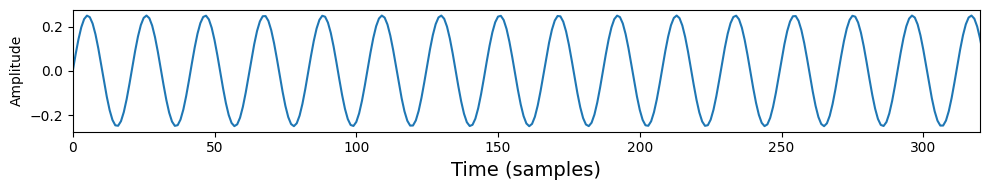

In [846]:
# Code to generate a sine wave and listen to it
# Sampling frequency
sr = 16000 #16KHz
# Amplitude
A = 0.25
# Frequency (Hertz)
f = 770
# Angular frequency (Radians)
w = 2*np.pi*f
# Duration of the signal (secs) - The signal needs to have a finite duration!
T = 1

# Time samples
t = np.arange(0, T, 1/sr)
# Create sine wave
s1 = A * np.sin(w*t)

# Plot signal
plt.figure(figsize=(10,2))
plt.plot(s1)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)', fontsize=14)
plt.ylabel('Amplitude')
plt.tight_layout()

# Play signal
ipd.Audio(s1, rate=sr)
print(s1.size)

**1.b-** Create a second signal but this time with a frequency of 1209 Hz and an amplitude of 0.25. Add it to your first signal and plot and play them.


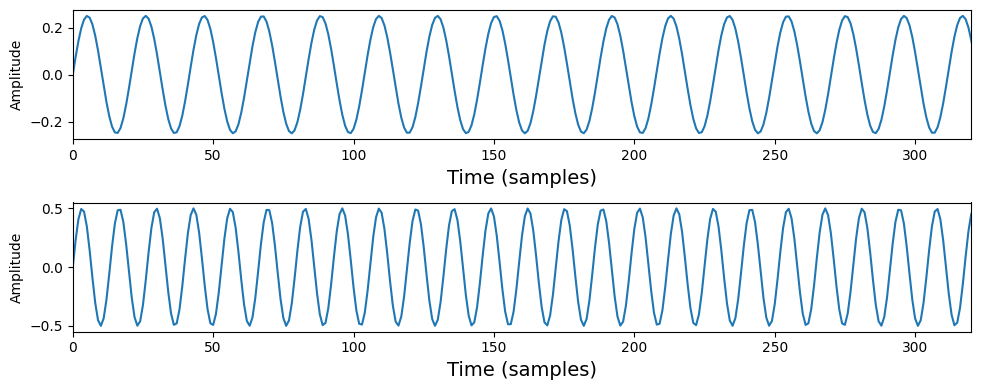

In [847]:
#2nd sine wave
# Sampling frequency
sr = 16000
# Amplitude
A = 0.5
# Frequency
f = 1209
# Frequency in Radians
w = 2*np.pi*f

# Create sine wave
s2 = A*np.sin(w*t)

# Plot
plt.figure(figsize=(10,4))

# Subplot 1
plt.subplot(2,1,1)
plt.plot(s1)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)', fontsize=14)
plt.ylabel('Amplitude')
plt.tight_layout()

# Subplot 2
plt.subplot(2,1,2)
plt.plot(s2)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)', fontsize=14)
plt.ylabel('Amplitude')
plt.tight_layout()



In [848]:
# Player
ipd.Audio(s1, rate=sr)


In [849]:
ipd.Audio(s2, rate=sr)

What is missing? Adding them!

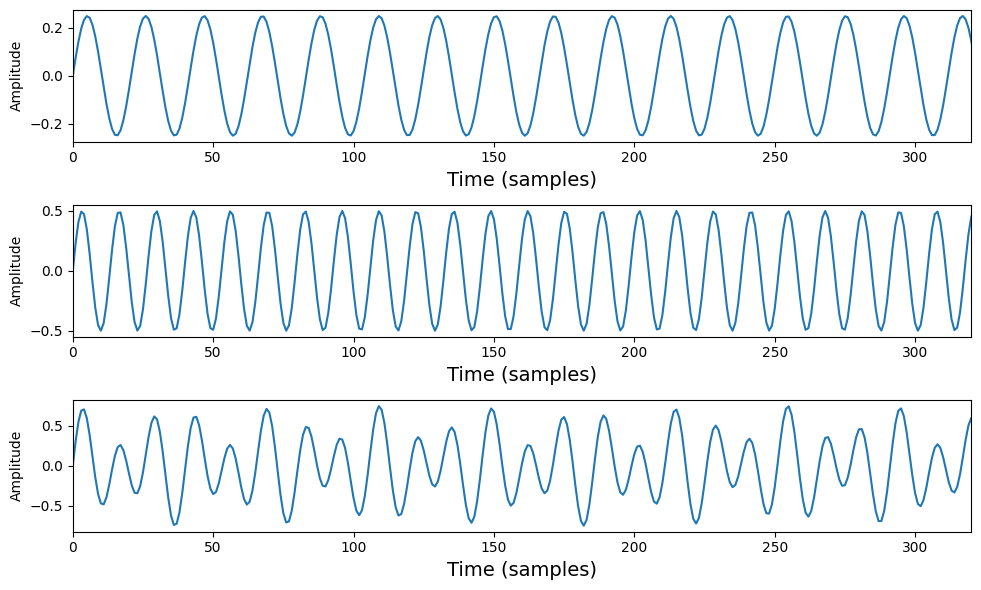

In [850]:
# Mix sine waves (create key press tone)
s_mix=s1+s2

# Plot mixed signal
plt.figure(figsize=(10,6))

# Subplot 1 (s1)
plt.subplot(3,1,1)
plt.plot(s1)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)', fontsize=14)
plt.ylabel('Amplitude')
plt.tight_layout()

# Subplot 2 (s2)
plt.subplot(3,1,2)
plt.plot(s2)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)', fontsize=14)
plt.ylabel('Amplitude')
plt.tight_layout()

# Subplot 3 (s_mix)
plt.subplot(3,1,3)
plt.plot(s_mix)
plt.xlim([0, 0.02*sr])
plt.xlabel('Time (samples)', fontsize=14)
plt.ylabel('Amplitude')
plt.tight_layout()

# Play all signals
ipd.display(ipd.Audio(s1, rate=sr))
ipd.display(ipd.Audio(s2, rate=sr))
ipd.display(ipd.Audio(s_mix, rate=sr))

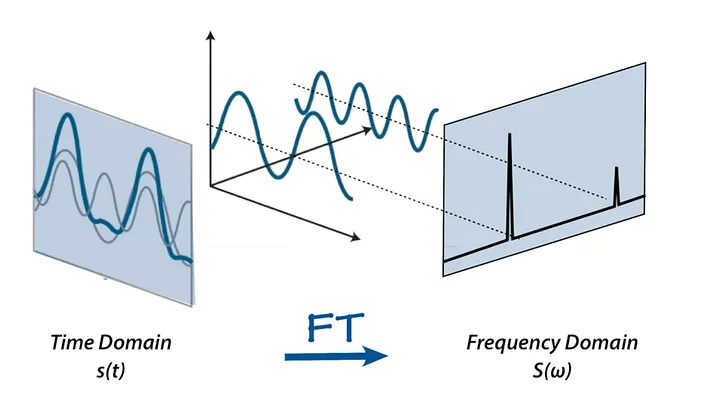

**1.c-** Let's compute a FFT (Fast Fourier Transform) to look at the signal in the frequency domain and see what tones are in the signal. There are lots of ways of doing this, e.g.: `numpy.fft.rfft`, `scipy.fftpack.fftfreq`, `librosa.piptrack`. Below is a small code that performs a FFT of an 1-D signal. Change it. Use the code below to extract the frequencies of the combined sequences above.


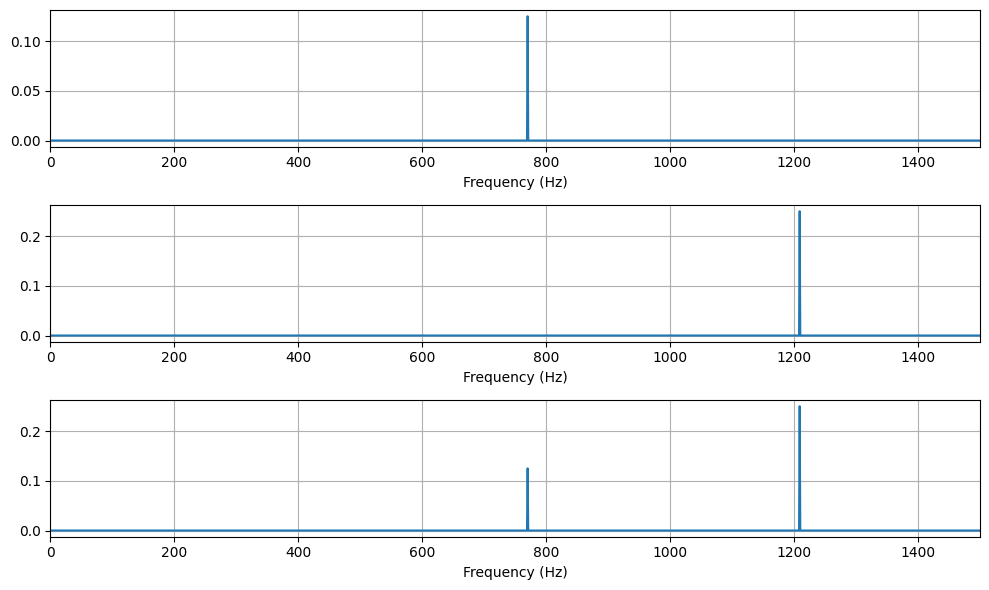

In [851]:
# Code to compute the FFT of the 3 signals. (needs the previous example to work)
from scipy import fftpack

# Sampling frequencies
sr = 16000 # This can be changed as you wish
# DFT length
N = len(t) # The FFT has a size that is a power of 2 => N = 2^r
# First, let's compute the DFT of s1 using FFT


X_1 = fftpack.fft(s1, n=N) # X_1(w), TF(x), F(x)
X_2 = fftpack.fft(s2, n=N)
X_mix = fftpack.fft(s_mix, n=N)

# Plot DFT
# fftfreq (window_length, sample spacing) -> sampling frequencies
# If we pass 1/sr as sample spacing the returned sampling frequencies will be in cycles/seconds (i.e. Hertz)
# If we pass 1 as sample spacing the returned sampling frequencies will be in cycles per unit, in this case we
# need to multiply by the sampling rate to get the same result i.e. the sampling frequencies in Hertz

# Calculate sampling frequencies
sampling_frequencies = fftpack.fftfreq(N, d=1/sr)

# Plot mixed signal
plt.figure(figsize=(10,6))

# Subplot 1 (s1)
plt.subplot(3,1,1)
plt.plot(sampling_frequencies[:N//2], np.abs(X_1)[:N//2]/N)
plt.xlim(0, 1500);
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.tight_layout()

# Subplot 2 (s2)
plt.subplot(3,1,2)
plt.plot(sampling_frequencies[:N//2], np.abs(X_2)[:N//2]/N)
plt.xlim(0, 1500);
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.tight_layout()

# Subplot 3 (s_mix)
plt.subplot(3,1,3)
plt.plot(sampling_frequencies[:N//2], np.abs(X_mix)[:N//2]/N)
plt.xlim(0, 1500);
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.tight_layout()



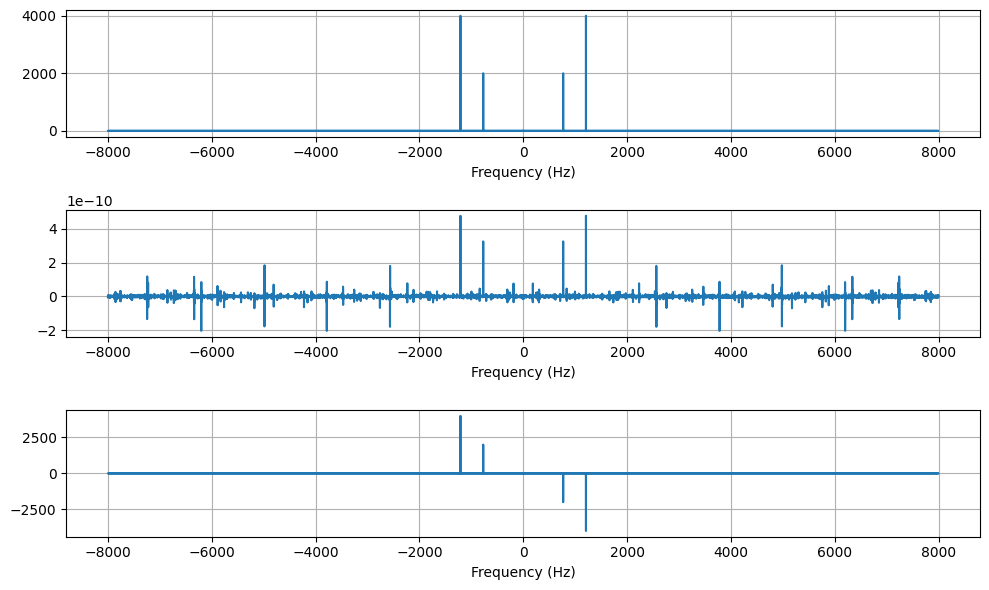

In [852]:
# Create sine wave
# Plot mixed signal
plt.figure(figsize=(10,6))

# Subplot 1 (s1)
plt.subplot(3,1,1)
plt.plot(sampling_frequencies, np.abs(X_mix))
#plt.xlim(0, 1500);
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.tight_layout()

# Subplot 2 (s2)
plt.subplot(3,1,2)
plt.plot(sampling_frequencies, np.real(X_mix))
#plt.xlim(0, 1500);
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.tight_layout()

# Subplot 3 (s_mix)
plt.subplot(3,1,3)
plt.plot(sampling_frequencies, np.imag(X_mix))
#plt.xlim(0, 1500);
plt.grid()
plt.xlabel('Frequency (Hz)')
plt.tight_layout()




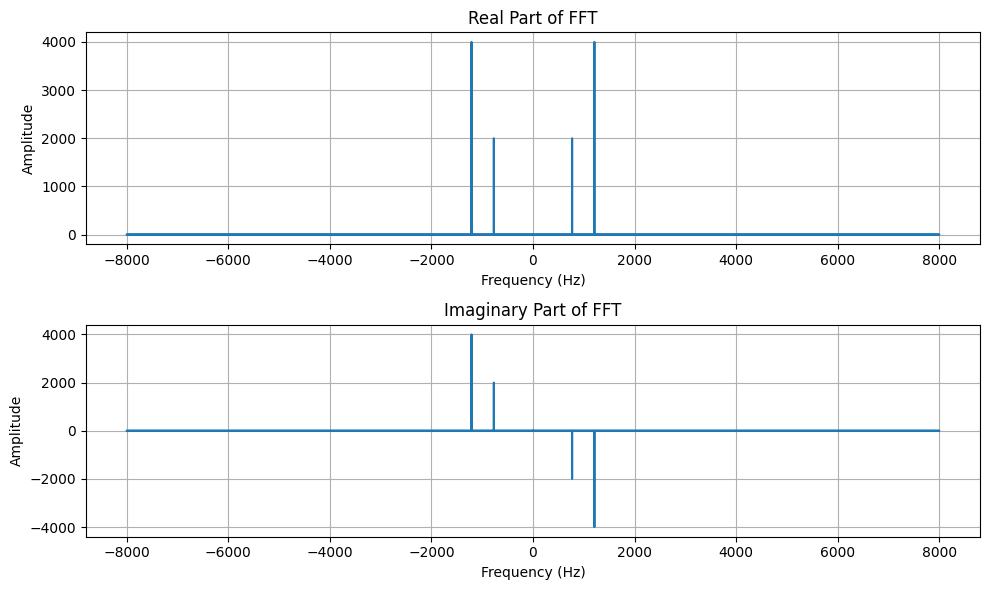

In [853]:
# Compute FFT
X_mix2 = np.fft.fft(s_mix, n=N)

# Frequency bins
freqs = np.fft.fftfreq(N, d=1/sr)

# Plotting the real and imaginary parts
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(freqs, np.abs(X_mix2))
plt.title('Real Part of FFT')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.grid()

plt.subplot(2, 1, 2)
plt.plot(freqs, np.imag(X_mix2))
plt.title('Imaginary Part of FFT')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.grid()

plt.tight_layout()
plt.show()

(array([ 1.,  1.,  0.,  0.,  0.,  0.,  1.,  1.,  0., 28.]),
 array([770.01475881, 770.03732504, 770.05989126, 770.08245749,
        770.10502372, 770.12758995, 770.15015617, 770.1727224 ,
        770.19528863, 770.21785485, 770.24042108]),
 <BarContainer object of 10 artists>)

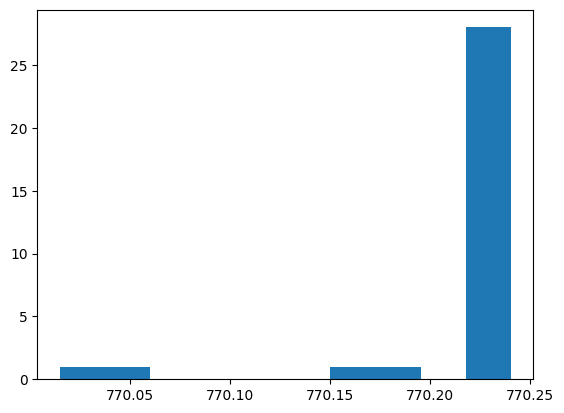

In [854]:
# Extract pitch -> [n,t] where n is the number of FFT points divided by 2 and t is the number of time frames
pitches, _ = librosa.piptrack(y=s1, sr=16000, n_fft=2048)

# Take all the valid pitches (i.e. that are not zero)
freqs=pitches[pitches>0].flatten()

# Plot histogram
plt.hist(freqs)

(array([ 1.,  1.,  0.,  0.,  0.,  0.,  1.,  1.,  0., 28.]),
 array([1209.10410151, 1209.13260586, 1209.16111021, 1209.18961456,
        1209.21811892, 1209.24662327, 1209.27512762, 1209.30363197,
        1209.33213632, 1209.36064067, 1209.38914502]),
 <BarContainer object of 10 artists>)

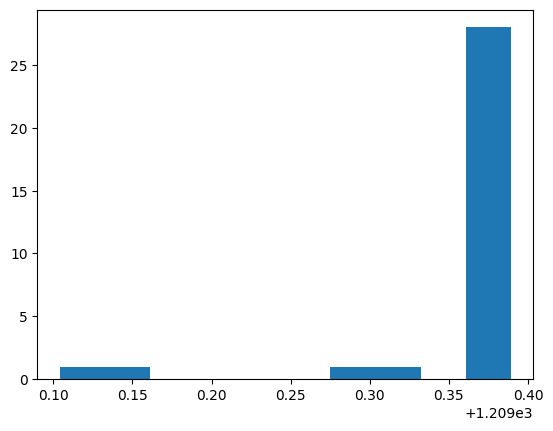

In [855]:
# Extract pitch -> [n,t] where n is the number of FFT points divided by 2 and t is the number of time frames
pitches, _ = librosa.piptrack(y=s2, sr=16000, n_fft=2048)

# Take all the valid pitches (i.e. that are not zero)
freqs=pitches[pitches>0].flatten()

# Plot histogram
plt.hist(freqs)

(array([32.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 32.]),
 array([ 769.45502483,  813.44843746,  857.4418501 ,  901.43526274,
         945.42867538,  989.42208802, 1033.41550066, 1077.4089133 ,
        1121.40232594, 1165.39573858, 1209.38915121]),
 <BarContainer object of 10 artists>)

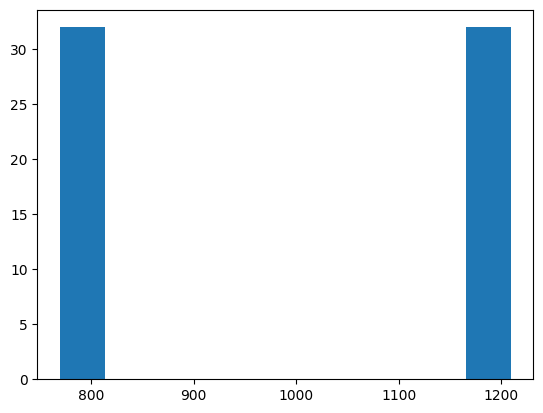

In [856]:
# Extract pitch -> [n,t] where n is the number of FFT points divided by 2 and t is the number of time frames
pitches, _ = librosa.piptrack(y=s_mix, sr=16000, n_fft=2048)

# Take all the valid pitches (i.e. that are not zero)
freqs=pitches[pitches>0].flatten()

# Plot histogram
plt.hist(freqs)

**1.d-** Mystery DTMF Number:  Write code using the audio python libraries we have introduced to decode the DTMF number in the file below.

- Visualize the signal in the time and frequency domain.
- What is the phone number in the example dtmfnumber.wav?

In [857]:
import os
import numpy as np
import librosa
import librosa.display
from scipy import fftpack
import matplotlib.pyplot as plt
import IPython.display as ipd

print("DIR original:", os.getcwd())
os.chdir('/Users/jayce/Desktop/DigMed/HM3')  #changed to my working directory
print("DIR working:", os.getcwd())
!ls

DIR original: /Users/jayce/Desktop/DigMed/HM3
DIR working: /Users/jayce/Desktop/DigMed/HM3
HW3.ipynb           dtmf_tones.wav      myvoice             speakerformants.csv
dtmf_generated.wav  dtmfnumbers.wav     phonemes
dtmf_signal.wav     myAudio             plots


In [858]:
numbers = 'dtmfnumbers.wav'
ipd.Audio(filename=numbers)

Text(0, 0.5, 'amplitude')

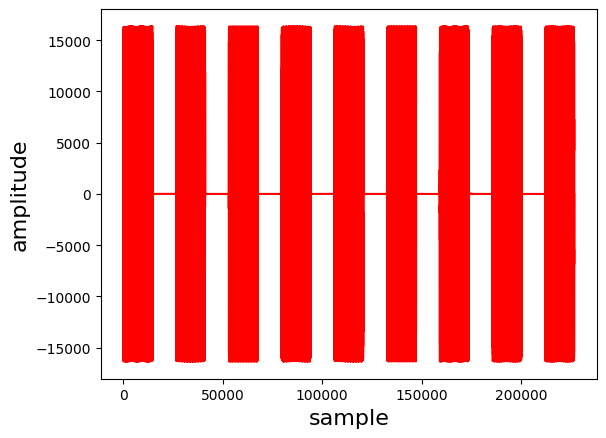

In [859]:
from wave import open as open_wave
fp = open_wave(numbers, 'r')

strframes = fp.readframes(fp.getnframes())
fp.close()
ys = np.frombuffer(strframes, dtype=np.int16)

fig,ax = plt.subplots()
ax.plot(ys,'-r')
ax.set_xlabel('sample',fontsize=16)
ax.set_ylabel('amplitude',fontsize=16)

Text(0, 0.5, 'amplitude')

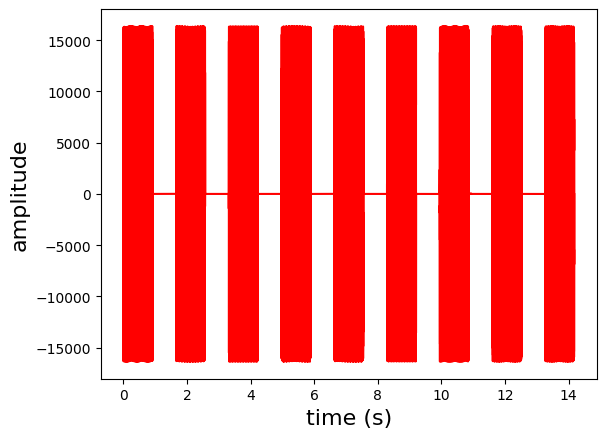

In [860]:
ts = np.arange(len(ys)) / (fp.getframerate())
fig,ax = plt.subplots()
ax.plot(ts,ys,'-r')
ax.set_xlabel('time (s)',fontsize=16)
ax.set_ylabel('amplitude',fontsize=16)

Decoded phone number: 018118055


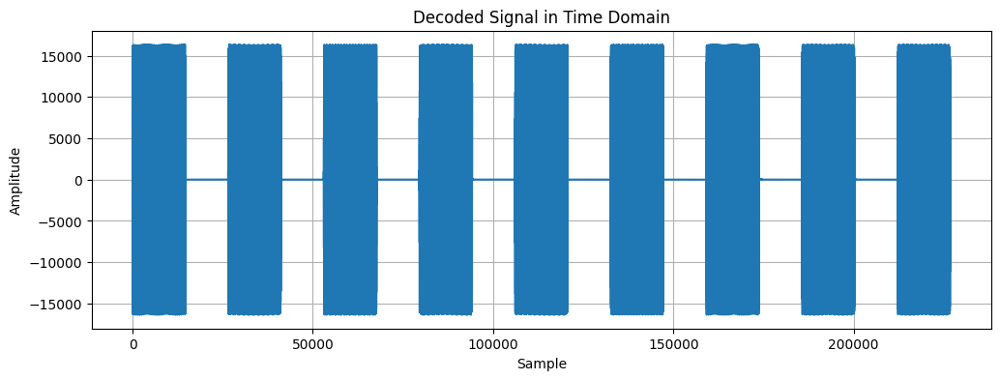

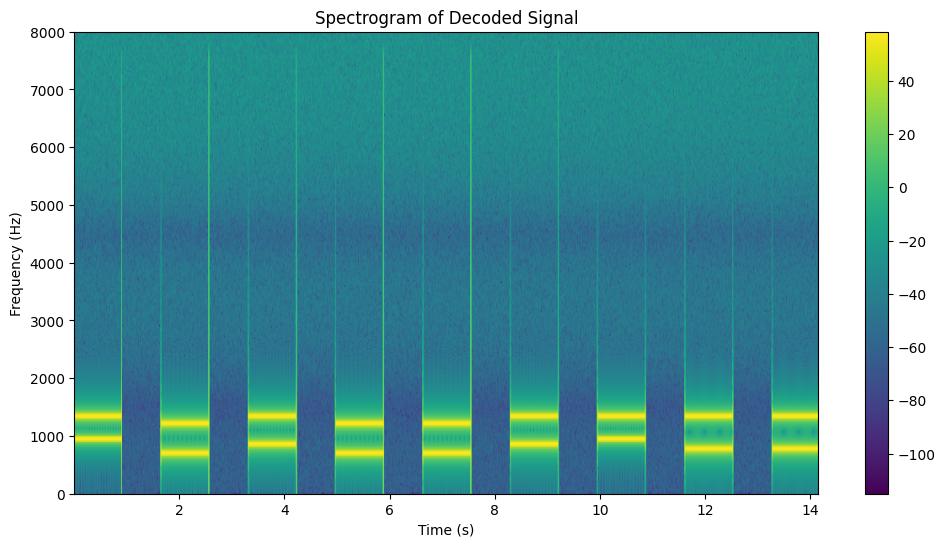

In [861]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import butter, filtfilt, find_peaks

# Function to decode a DTMF signal into a phone number 
def DtmfDecode(signal, Fs=8000, freq_tol=20):
    # Define DTMF frequencies
    rowfreqs = [697, 770, 852, 941]
    colfreqs = [1209, 1336, 1477, 1633]

    # Create bandpass filters for DTMF frequencies
    row_filters = [butter(4, [freq - freq_tol, freq + freq_tol], btype='bandpass', fs=Fs) for freq in rowfreqs]
    col_filters = [butter(4, [freq - freq_tol, freq + freq_tol], btype='bandpass', fs=Fs) for freq in colfreqs]

    # Define segment length 
    segment_length = len(signal) // 9  # 9 tones in the phone number

    decoded_number = ''
    
    # Iterate over segments corresponding to each digit
    for i in range(9):
        segment = signal[i * segment_length : (i + 1) * segment_length]

        # Apply filters for row frequencies
        row_peaks = []
        for b, a in row_filters:
            filtered_signal = filtfilt(b, a, segment)
            peak_indices, _ = find_peaks(filtered_signal, height=0.5)
            row_peaks.append(len(peak_indices))

        # Apply filters for column frequencies
        col_peaks = []
        for b, a in col_filters:
            filtered_signal = filtfilt(b, a, segment)
            peak_indices, _ = find_peaks(filtered_signal, height=0.5)
            col_peaks.append(len(peak_indices))

        # Find the indices of the maximum peak count for rows and columns
        max_row_index = np.argmax(row_peaks)
        max_col_index = np.argmax(col_peaks)

        # Map the indices back to the corresponding button on the keypad
        for key, value in DTMF.items():
            if abs(value[0] - rowfreqs[max_row_index]) <= freq_tol and abs(value[1] - colfreqs[max_col_index]) <= freq_tol:
                decoded_digit = key
                decoded_number += decoded_digit
                break

    return decoded_number

# Load the audio file
fs, signal = wavfile.read("dtmfnumbers.wav")

# Decode the DTMF signal
decoded_number = DtmfDecode(signal, Fs=fs)

# Print the decoded phone number
print("Decoded phone number:", decoded_number)




# Plot the decoded signal in the time domain
plt.figure(figsize=(12, 4))
plt.plot(signal)
plt.title('Decoded Signal in Time Domain')
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.grid(True)
plt.show()

# Plot the spectrogram of the decoded signal
plt.figure(figsize=(12, 6))
plt.specgram(signal, Fs=fs, NFFT=512, noverlap=256)
plt.title('Spectrogram of Decoded Signal')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar()
plt.show()



**1.e-**  Create a function to turn a phone number into a DTMF wav file.

**1.f-** Create a function to decode a DTMF number (or more generally numbers).

In [862]:
# Import necessary libraries
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import Audio

# Define the sampling frequency
Fs = 8000

# Define the length of each tone
dur = 1

# Define the space between tones
s = 1

# Array representing silence between tones
space = np.zeros(int(s * fs))

# Dictionary to map each digit to its corresponding pair of frequencies.
DTMF = {"1": (697, 1209), "2": (697, 1336), "3": (697, 1477),
        "4": (770, 1209), "5": (770, 1336), "6": (770, 1477),
        "7": (852, 1209), "8": (852, 1336), "9": (852, 1477),
        "0": (941, 1336)}

# Function to generate DTMF tones for a phone number
def DtmfEncodeDigit(phonenumber, dither=False):
    # Define the time array for one tone using the global sampling frequency and tone duration
    t = np.linspace(0, dur, int(dur * Fs), endpoint=False)
    silence = np.zeros(int(s * Fs))  # Use the global space between tones for silence
    
    sounds = []  # List to store the DTMF tones
    for key in phonenumber:
        if key in DTMF:  # Check if the key is in the DTMF table
            fr, fc = DTMF[key]  # Get the row and column frequencies for the key
            if dither:  # Add dithering if specified
                fr += dither * (np.random.rand() - 0.5)
                fc += dither * (np.random.rand() - 0.5)
            # Generate sine waves for row and column frequencies and add them together
            sounds.append(np.sin(2 * np.pi * fr * t) + np.sin(2 * np.pi * fc * t))
            # Add silence between tones
            sounds.append(silence)
    
    # Concatenate the list of sounds into a single array and remove the last silence
    return np.concatenate(sounds[:-1])

# Function to encode a phone number into a 2D array with encoded frequencies
def DTMF_encoder(phonenumber,dur=0.5,silencedur=0.1): #Takes in a String and Returns a 2D Array with Encoded Frequencies with
    encodedFreqs = np.zeros((len(phonenumber),4000)) 
    SAMPLE_NO = len(DtmfEncodeDigit(phonenumber[0]))

    for numIndex in range(len(phonenumber)):
        for j in range(SAMPLE_NO):
            encodedFreqs[numIndex][j] = DtmfEncodeDigit(phonenumber[numIndex])[j]
    return encodedFreqs

#myphone = '5127711378'
# Get user input for their phone number
user_number = input("Enter your phone number: ")
print("Generating tones for your phone number frequencies...")

# Encode the phone number into a DTMF signal
encoded = DtmfEncodeDigit(user_number)

# Play the DTMF signal
Audio(encoded,rate=Fs)

Enter your phone number:  5127711378


Generating tones for your phone number frequencies...


In [863]:
import numpy as np
from scipy.signal import butter, filtfilt, find_peaks

# Function to decode a DTMF signal into a phone number
def DtmfDecode(signal, Fs=8000):
    # Define DTMF frequencies
    rowfreqs = [697, 770, 852, 941]
    colfreqs = [1209, 1336, 1477, 1633]

    # Create bandpass filters for DTMF frequencies
    row_filters = [butter(4, [freq*(0.95), freq*(1.05)], btype='bandpass', fs=Fs) for freq in rowfreqs]
    col_filters = [butter(4, [freq*(0.95), freq*(1.05)], btype='bandpass', fs=Fs) for freq in colfreqs]

    # Define segment length (assuming each digit is encoded with the same duration)
    segment_length = int(len(signal) / len(user_number))

    decoded_number = ''
    
    # Iterate over segments corresponding to each digit
    for i in range(len(user_number)):
        segment = signal[i * segment_length : (i + 1) * segment_length]

        # Apply filters for row frequencies
        row_peaks = []
        for b, a in row_filters:
            filtered_signal = filtfilt(b, a, segment)
            peak_indices, _ = find_peaks(filtered_signal, height=0.5)
            row_peaks.append(len(peak_indices))

        # Apply filters for column frequencies
        col_peaks = []
        for b, a in col_filters:
            filtered_signal = filtfilt(b, a, segment)
            peak_indices, _ = find_peaks(filtered_signal, height=0.5)
            col_peaks.append(len(peak_indices))

        # Find the indices of the maximum peak count for rows and columns
        max_row_index = np.argmax(row_peaks)
        max_col_index = np.argmax(col_peaks)

        # Map the indices back to the corresponding button on the keypad
        decoded_digit = list(buttons.keys())[list(buttons.values()).index((max_row_index, max_col_index))]
        decoded_number += decoded_digit

    return decoded_number

# Example usage:
decoded_number = DtmfDecode(encoded)
print("decoded_number: ",decoded_number)


decoded_number:  5127711378


## **Question 2:** Speech and Audio

This question explores the temporal and frequency characteristics of phonems and vowels.  

**Helper Functions**


- do not forget the libraries
- plotSpectrum is just a helper function to allow us to plot the spectrum with labelled axes with a set range.

In [889]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import fftpack
from os import listdir
import IPython.display as ipd

%matplotlib inline

In [890]:

def plotSpectrum(freq,mag,fname):
    fig1, ax=plt.subplots(1)

    ax.plot(freq, mag, color='gray')
    plt.grid()
    plt.xlim(0, 1500);
    plt.xlabel('Frequency (Hz)')
    plt.title(fname)
    plt.xlim((0,3000))
    plt.xlabel('Freq. (Hz)')
    plt.ylabel('Magnitude')
    plt.tight_layout()
    plt.savefig('plots/'+fname+'.png')

**2.a-** Setup our Data

-  setup a subdirectory for storing the wav files.
-  Download the data
-  Parse the files and create a dataframe with the phoneme label and speakerid. Create columns for the format (F1 and F2) values.
-  After downloading, let's examine the signals.

In [891]:
import os
print("DIR original:", os.getcwd())
os.chdir('/Users/jayce/Desktop/DigMed/HM3')  #changed to my working directory
print("DIR working:", os.getcwd())
!ls

DIR original: /Users/jayce/Desktop/DigMed/HM3
DIR working: /Users/jayce/Desktop/DigMed/HM3
HW3.ipynb           dtmf_tones.wav      myvoice             speakerformants.csv
dtmf_generated.wav  dtmfnumbers.wav     phonemes
dtmf_signal.wav     myAudio             plots


In [892]:
basedir='./phonemes/'
phonemefilenames= os.listdir(basedir)
phonemenames=[]
formants=[[],[]]
phonemefilenames = [x for x in phonemefilenames if x.__contains__('.wav')] # remove non-wavfiles from list

# parse out the word names from the files by getting the text between the - and the .wav extn
phonemenames = [name.split('-')[-1].split('.')[0] for name in phonemefilenames]
speakerid = [name.split('-')[0].split('.')[0] for name in phonemefilenames]
dfformants=pd.DataFrame(columns=['speaker','word','f1','f2'])
dfformants['speaker']=speakerid
dfformants['word']=phonemenames

In [893]:
import os
import pandas as pd

print("DIR original:", os.getcwd())
os.chdir('/Users/jayce/Desktop/DigMed/HM3')  # changed to my working directory
print("DIR working:", os.getcwd())
!ls

basedir = './phonemes/'
phonemefilenames = os.listdir(basedir)
phonemenames = []

# Filter only .wav files
phonemefilenames = [x for x in phonemefilenames if x.endswith('.wav')]


# Extract formant values from audio files
for idx, filename in enumerate(phonemefilenames):
    full_path = os.path.join(basedir, filename)
    snd = parselmouth.Sound(full_path)
    formant = snd.to_formant_burg(max_number_of_formants=2)
    
    # Get the duration of the sound
    duration = snd.get_total_duration()
    
    # Initialize lists to store F1 and F2 values
    f1_values = []
    f2_values = []
    
    # Iterate over time points
    time_step = 0.01  # Choose a time step (in seconds)
    for time_point in np.arange(0, duration, time_step):
        f1 = formant.get_value_at_time(1, time_point)
        f2 = formant.get_value_at_time(2, time_point)
        if not pd.isnull(f1):
            f1_values.append(f1)
        if not pd.isnull(f2):
            f2_values.append(f2)
    
    # Calculate mean F1 and F2 values
    f1_value = sum(f1_values) / len(f1_values) if f1_values else None
    f2_value = sum(f2_values) / len(f2_values) if f2_values else None

    # Assign F1 and F2 values to the DataFrame
    dfformants.at[idx, 'f1'] = f1_value
    dfformants.at[idx, 'f2'] = f2_value

# Display the DataFrame
print(dfformants)


DIR original: /Users/jayce/Desktop/DigMed/HM3
DIR working: /Users/jayce/Desktop/DigMed/HM3
HW3.ipynb           dtmf_tones.wav      myvoice             speakerformants.csv
dtmf_generated.wav  dtmfnumbers.wav     phonemes
dtmf_signal.wav     myAudio             plots
   speaker   word           f1           f2
0   453353   hard  1482.952063   3248.02938
1   453353    had  1858.690343  3164.646659
2   453353  heard  1632.224321  2983.664431
3   453353   hudd  2059.838219  3885.318761
4   453353   hood  1759.776334   3476.15599
5   453353  hoard  1585.323062  3759.613351
6   453353   head  1984.967914  3459.636311
7   453353    hid  2276.962751  3797.102523
8   453353    hod  1548.734062  3487.383627
9   453353   whod     1728.554  3487.070187
10  453353   heed  2260.412684  3689.081315


**2.b- See and Hear**

Before we do anything let's sanity check the data, let's look at it and listen to it.  
- listen to each of the signals;
- with the help of the function below, visualize each of the signals in the temporal and frequency (fft) domains;
- Change the `offset` and `duration` params in the visualisation and some of the other parameters (e.g. `n_fft=512`) and visualize some of the signals to see the differences.  

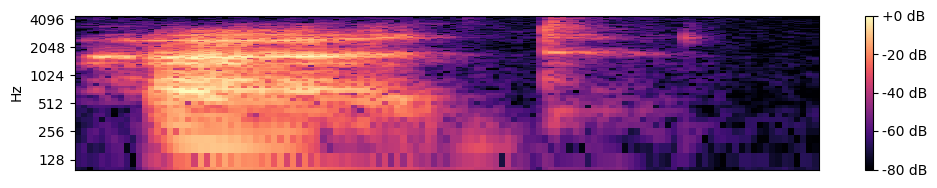

<Figure size 1200x300 with 0 Axes>

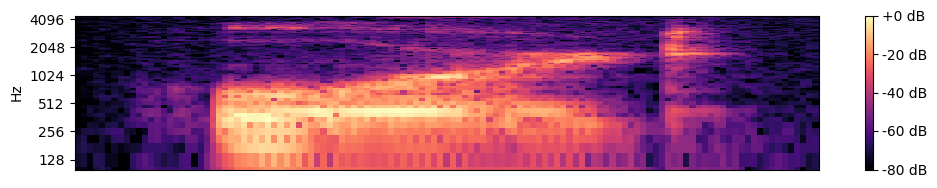

<Figure size 1200x300 with 0 Axes>

In [894]:
for fileidx in [1,5]:

    x_1, sr = librosa.load(basedir+phonemefilenames[fileidx],offset=.1, duration=.7)
    plt.figure(figsize=(12, 2))
    D1 = librosa.amplitude_to_db(np.abs(librosa.stft(x_1,n_fft=512)),  ref=np.max)
    librosa.display.specshow(D1, y_axis='log')
    #plt.title(phonemenames[fileidx])
    plt.ylim(100,4500)
    plt.colorbar(format='%+2.0f dB')
    plt.figure(figsize=(12, 3))


In [895]:
ipd.Audio(x_1, rate=sr)

In [896]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

# Load the audio file
fileidx = 1  # Index of the second file
x, sr = librosa.load(basedir + phonemefilenames[fileidx], offset=0.1, duration=0.7)

# Path to the directory containing the audio files
basedir = './phonemes/'

# Get a list of all audio files in the directory
audio_files = [file for file in os.listdir(basedir) if file.endswith('.wav')]

# Iterate over each audio file and play it
for audio_file in audio_files:
    # Load the audio file
    audio_path = os.path.join(basedir, audio_file)
    
    # Display the audio player
    print("Playing:", audio_file)
    ipd.display(ipd.Audio(audio_path))



Playing: 453353-hard.wav


Playing: 453353-had.wav


Playing: 453353-heard.wav


Playing: 453353-hudd.wav


Playing: 453353-hood.wav


Playing: 453353-hoard.wav


Playing: 453353-head.wav


Playing: 453353-hid.wav


Playing: 453353-hod.wav


Playing: 453353-whod.wav


Playing: 453353-heed.wav


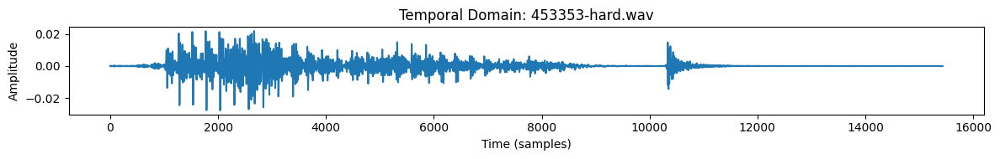

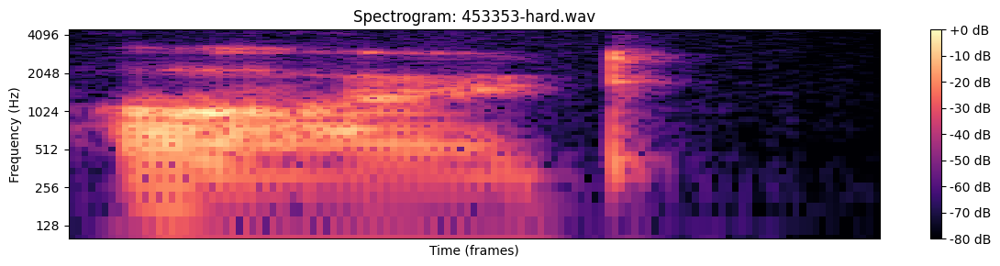

Playing: 453353-hard.wav


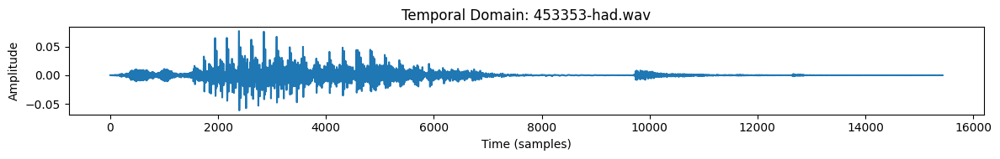

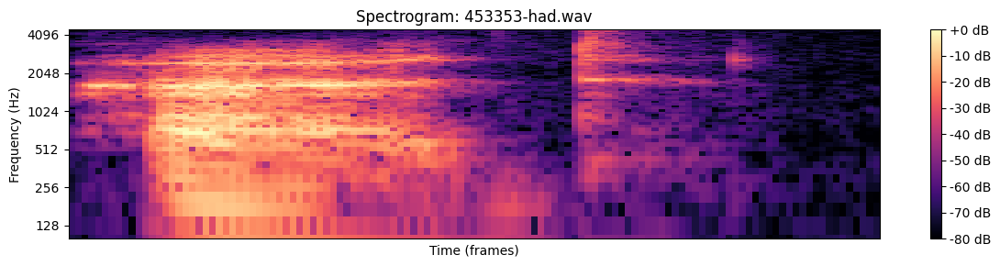

Playing: 453353-had.wav


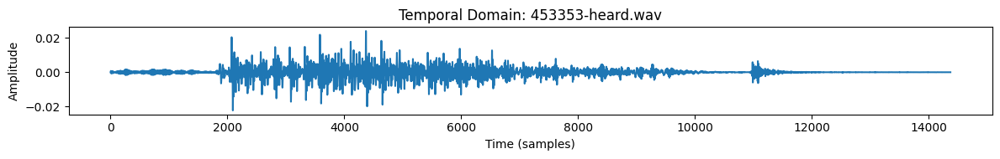

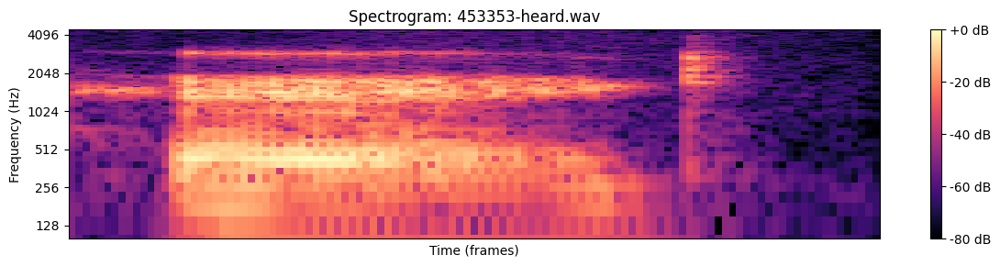

Playing: 453353-heard.wav


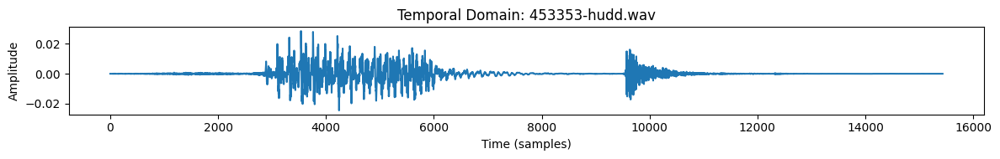

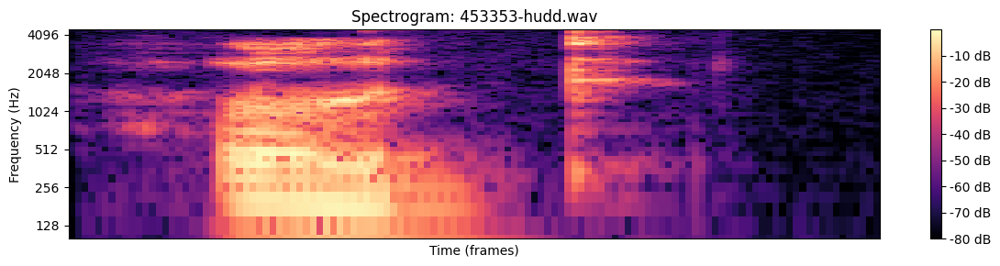

Playing: 453353-hudd.wav


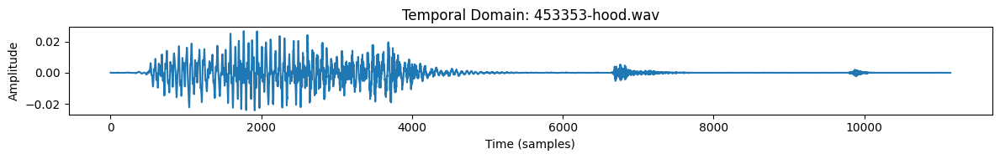

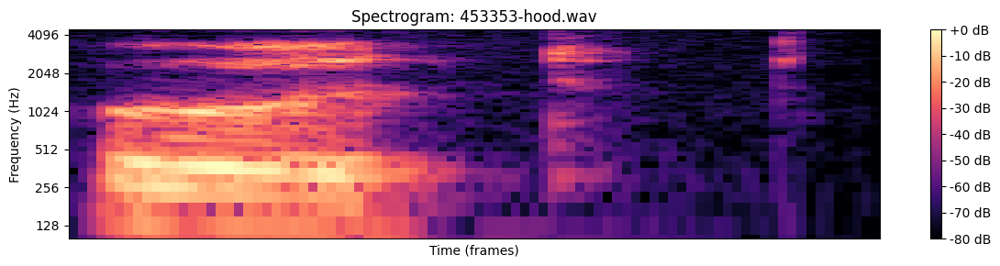

Playing: 453353-hood.wav


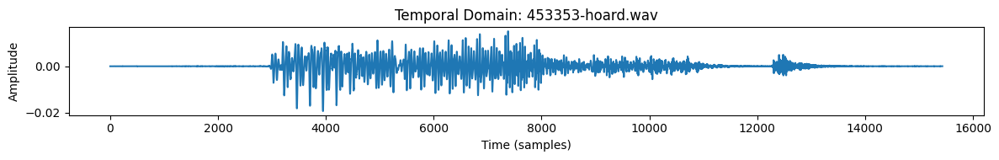

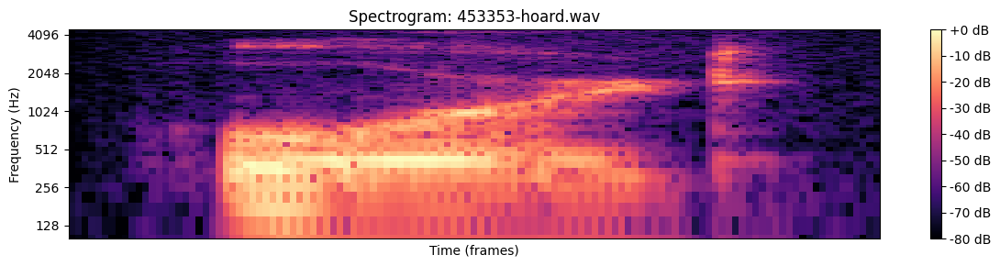

Playing: 453353-hoard.wav


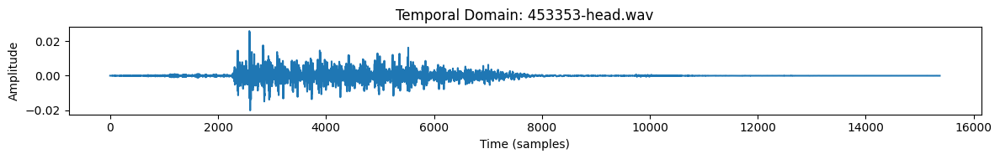

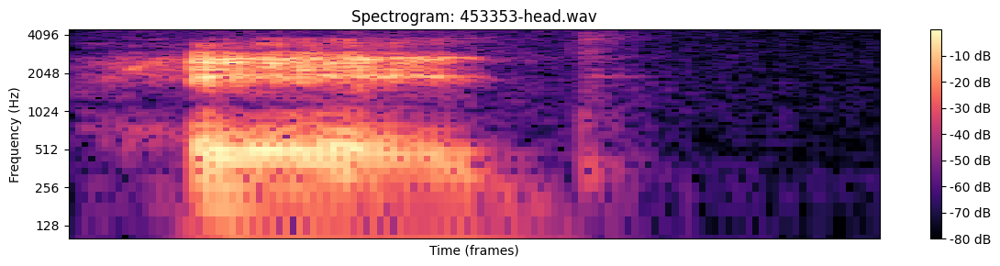

Playing: 453353-head.wav


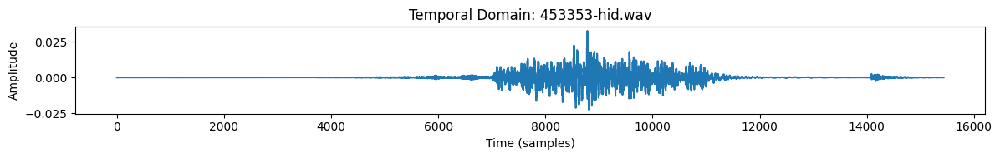

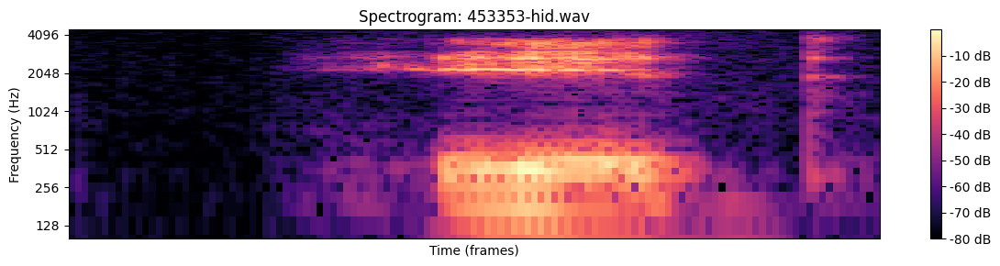

Playing: 453353-hid.wav


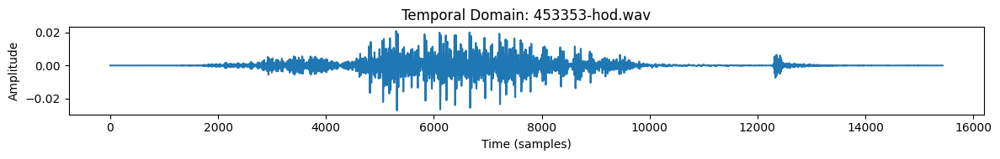

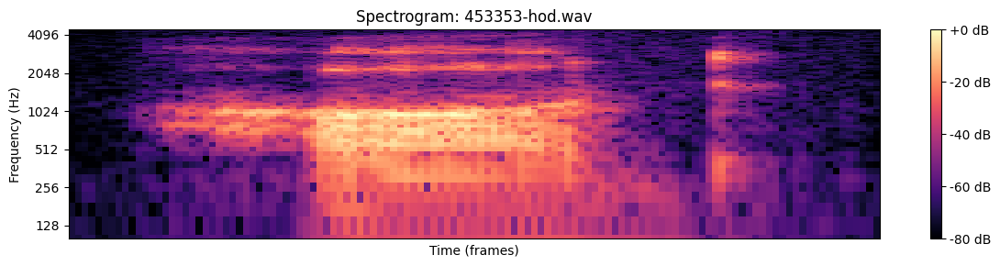

Playing: 453353-hod.wav


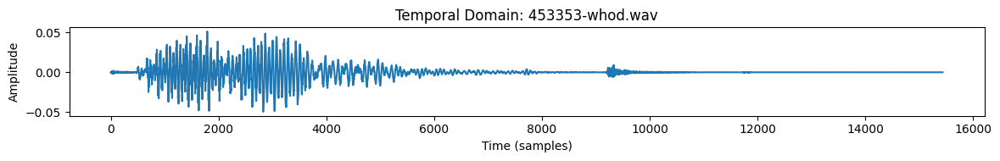

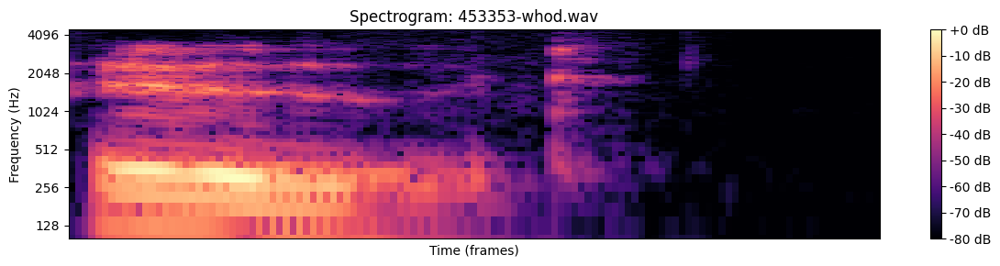

Playing: 453353-whod.wav


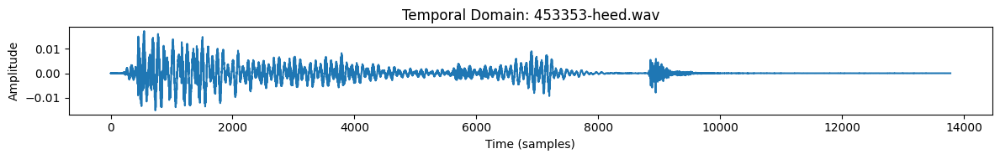

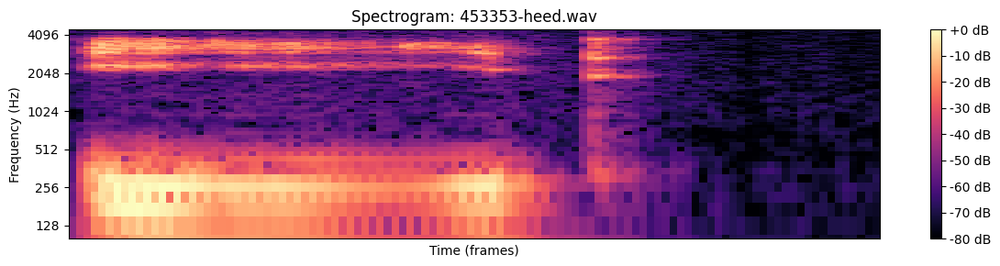

Playing: 453353-heed.wav


In [897]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

# Path to the directory containing the audio files
basedir = './phonemes/'

# Get a list of all audio files in the directory
audio_files = [file for file in os.listdir(basedir) if file.endswith('.wav')]

# Iterate over each audio file
for fileidx, audio_file in enumerate(audio_files):
    # Load the audio file
    # modify the offset and duration to see the change!
    #x, sr = librosa.load(os.path.join(basedir, audio_file), offset=0.5, duration=1.0)

    x, sr = librosa.load(os.path.join(basedir, audio_file), offset=0.1, duration=0.7)
    
    # Plot the signal in the temporal domain
    plt.figure(figsize=(12, 2))
    plt.plot(x)
    plt.title("Temporal Domain: " + audio_file)
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()
    
    # Compute and plot the spectrogram in the frequency domain
    plt.figure(figsize=(12, 3))
    # Change n_fft to 1024 to see the differences.
    #D = librosa.amplitude_to_db(np.abs(librosa.stft(x, n_fft=1024)), ref=np.max)

    D = librosa.amplitude_to_db(np.abs(librosa.stft(x, n_fft=512)), ref=np.max)
    librosa.display.specshow(D, y_axis='log')
    plt.title("Spectrogram: " + audio_file)
    plt.colorbar(format='%+2.0f dB')
    plt.ylim(100, 4500)
    plt.xlabel('Time (frames)')
    plt.ylabel('Frequency (Hz)')
    plt.tight_layout()
    plt.show()

    # Display the audio
    print("Playing:", audio_file)
    ipd.display(ipd.Audio(os.path.join(basedir, audio_file)))


**2.c Computing the spectrum and extracting F1, F2**

* We will use `fftpack.fft` to get the frequency spectrum components for the files. `fftpack.fftfreq` gives us the frequencies associated with the intensities.
* We do not need to process the entire file. the files all start with a short silence and duration of 0.5 s will suffice.
* We will use plotSpectum to save the plots into a `plots` sub directory.
* We will take the lists we create, transpose them from rows to columns and put them into a data frame.
* Using the rough approximation from the graph we introduced in the lecture, we make the assumption that $250 \leq F1 \leq 650$ and $650 \leq F2 \leq 2600$.
* So, using the librosa peakfinder `librosa.util.peak_pick` we will find the peaks in the F1 and F2 ranges.
* Save these into the dataframe we created earlier and save that to a csv file.

**librosa.util.peak_pick(data, pre_max, post_max, pre_avg, post_avg, delta, wait)**

Parameters:
- data: The input data sequence (e.g., magnitude spectrogram).
- pre_max: The number of frames before a peak that must be smaller than the peak itself to consider the peak valid. This helps in filtering out small peaks.
- post_max: The number of frames after a peak that must be smaller than the peak itself to consider the peak valid. This also helps in filtering out small peaks.
- pre_avg: The number of frames before a peak used for computing the mean background amplitude.
- post_avg: The number of frames after a peak used for computing the mean background amplitude.
- delta: A threshold value used to determine if a peak is valid. If the difference between a peak's amplitude and the local mean background amplitude is greater than this threshold, the peak is considered valid.
- wait: The number of frames to wait after a valid peak is found before accepting another peak. This helps in filtering out closely spaced peaks.

Returns:
- An array containing indices of the peaks found in the input data sequence.

Purpose:
- The peak_pick function is typically used in audio signal processing tasks, especially in tasks related to onset detection or feature extraction from audio signals. It helps in identifying significant peaks in a magnitude spectrogram, which may correspond to salient features or events in the audio signal.

plots directory already exists
Phoneme filenames: ['453353-hard.wav', '453353-had.wav', '453353-heard.wav', '453353-hudd.wav', '453353-hood.wav', '453353-hoard.wav', '453353-head.wav', '453353-hid.wav', '453353-hod.wav', '453353-whod.wav', '453353-heed.wav']
phonemenames: ['hard', 'had', 'heard', 'hudd', 'hood', 'hoard', 'head', 'hid', 'hod', 'whod', 'heed']


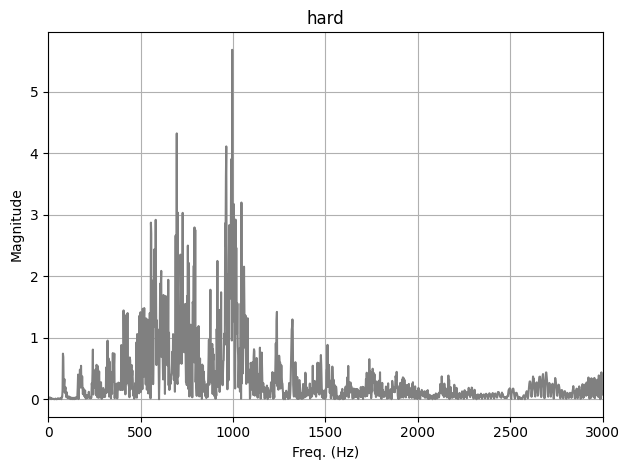

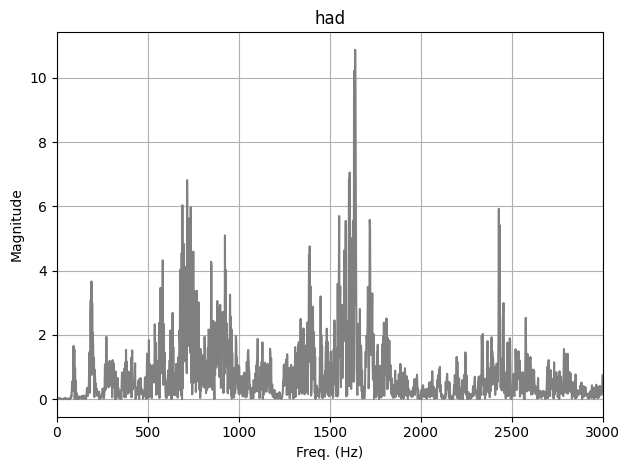

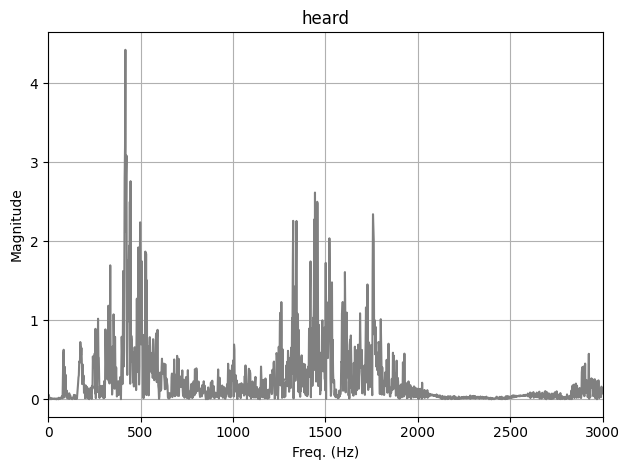

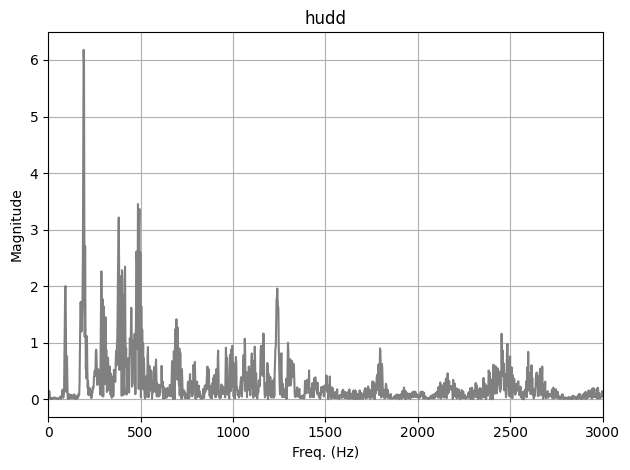

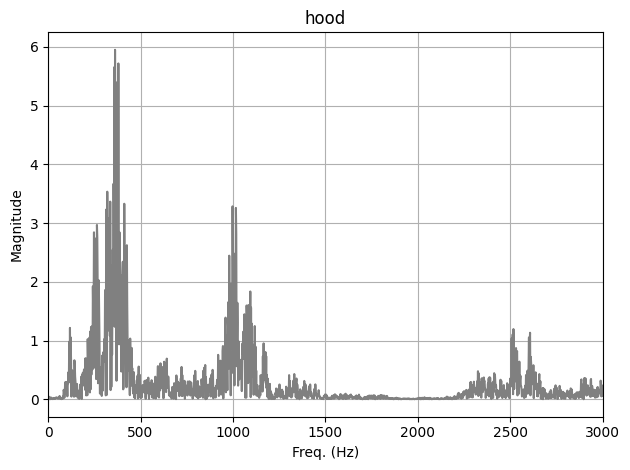

...

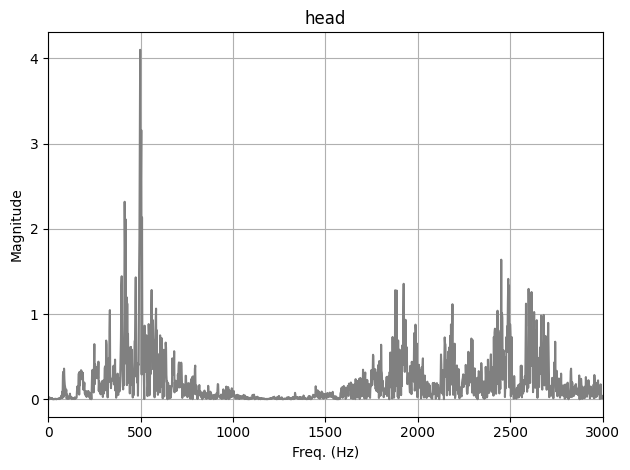

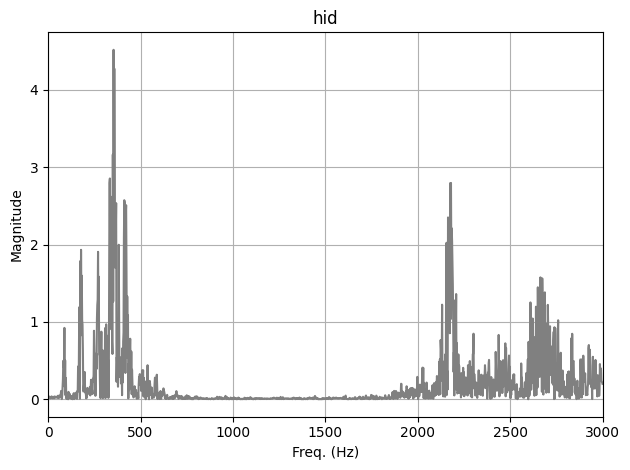

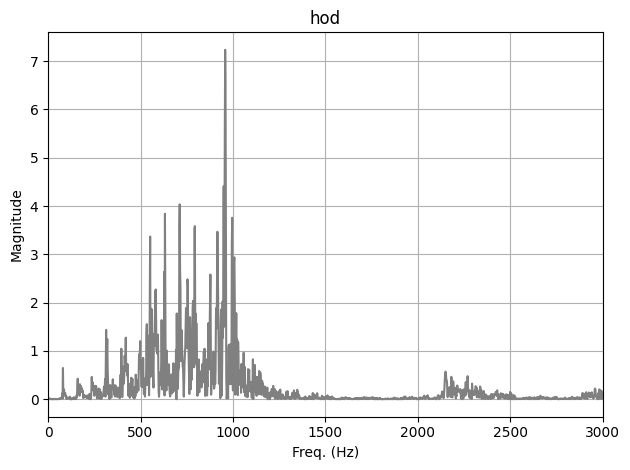

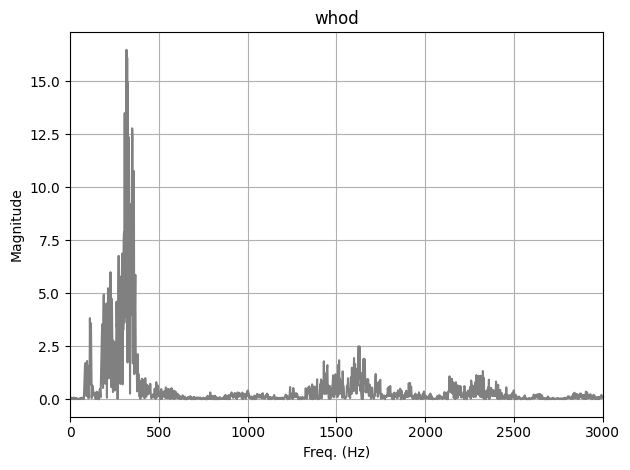

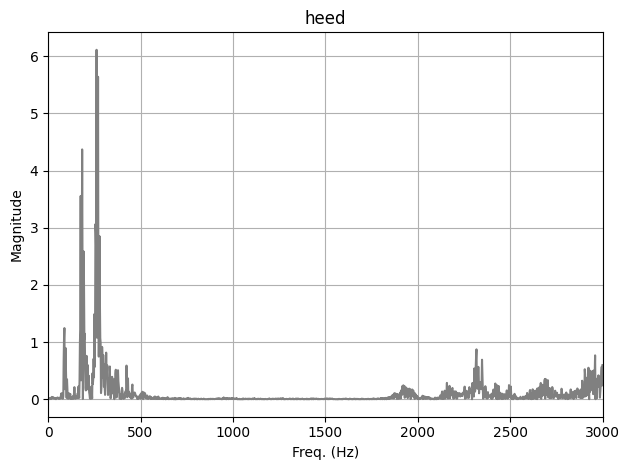

In [898]:
import os
import pandas as pd
import librosa
import numpy as np
from scipy import fftpack
import matplotlib.pyplot as plt
import librosa.display

# Create plots directory if it doesn't exist
try:
    os.mkdir('plots')
except OSError:
    print('plots directory already exists')

# Parse out the word names from the files by getting the text between the - and the .wav extension
phonemenames = [name.split('-')[-1].split('.')[0] for name in phonemefilenames]

# Print the phoneme filenames for inspection
print("Phoneme filenames:", phonemefilenames)
print("phonemenames:", phonemenames)
# Initialize formants list
formants = [[], []]

for idx, fname in enumerate(phonemefilenames):
    x_1, fs = librosa.load(basedir + fname, duration=0.5, offset=0.1)

    # Compute FFT
    X = fftpack.fft(x_1)
    freq = fftpack.fftfreq(len(x_1)) * fs
    freqidx = int(len(freq) / 2)
    freq = freq[1:freqidx]
    mag = np.abs(X.real)
    mag = mag[1:freqidx]

    # Plot spectrum
    plotSpectrum(freq, mag, phonemenames[idx])

    # Find peaks using librosa peak_pick
    indexes = librosa.util.peak_pick(mag, pre_max=3, post_max=3, pre_avg=3, post_avg=5, delta=0.1, wait=1)
    peaks = [freq[indexes], mag[indexes]]

    # Create DataFrame
    peaksdf = pd.DataFrame(peaks).T
    peaksdf.columns = ['freq', 'mag']

    # Find F1 and F2 formants
    fmin = 250
    f1max = 650
    f2max = 3000

    f1peaks = peaksdf[peaksdf.freq.between(fmin, f1max)]
    f1 = f1peaks['freq'][f1peaks['mag'].idxmax()]

    f2peaks = peaksdf[peaksdf.freq.between(f1max, f2max)]
    f2 = f2peaks['freq'][f2peaks['mag'].idxmax()]

    # Append formants to the list
    formants[0].append(f1)
    formants[1].append(f2)


# Create DataFrame with formants
dfformants = pd.DataFrame(columns=['speaker', 'word', 'f1', 'f2'])
dfformants['speaker'] = speakerid
dfformants['word'] = phonemenames
dfformants['f1'] = formants[0]
dfformants['f2'] = formants[1]

# Save DataFrame to CSV
dfformants.to_csv('speakerformants.csv')




Vowel F1/F2 Scatter Plot

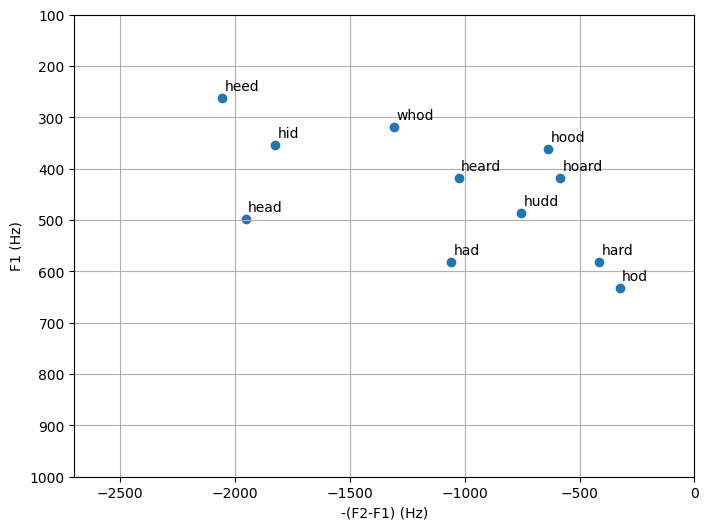

In [899]:
fig1=plt.figure(figsize=(8, 6))
ax2=fig1.add_subplot(111)
plt.scatter(-(dfformants['f2']-dfformants['f1']),dfformants['f1'])

for idx, phonemename in enumerate(phonemenames):
    ax2.annotate(phonemename,  xy=(-(formants[1][idx]-formants[0][idx])+10,formants[0][idx]-15))

#plt.grid('both')
plt.xlim((-2700, 0))
plt.ylim((1000, 100))
plt.grid(axis='both')
plt.xlabel('-(F2-F1) (Hz)')
plt.ylabel('F1 (Hz)')

plt.savefig('plots/vowelf1f2male453353.png')
plt.show()

**2.d Computing the Fundamental Frequency (F0)**

* Describes the tone of the voice (roughly in the range 80 to 450 Hz).
* Closely related to pitch, F0 describes the actual physical phenomenon, whereas pitch describes how our ears and brains interpret the signal.
* `librosa` provides the `pyin` function to compute F0 using a modified version of the YIN algorithm.

Reference:
* [Introduction to Speech Processing](https://speechprocessingbook.aalto.fi/)
* [Mauch, Matthias, and Simon Dixon. “pYIN: A fundamental frequency estimator using probabilistic threshold distributions.” 2014 IEEE International Conference on Acoustics, Speech and Signal Processing (ICASSP). IEEE, 2014.](https://www.eecs.qmul.ac.uk/~simond/pub/2014/MauchDixon-PYIN-ICASSP2014.pdf)

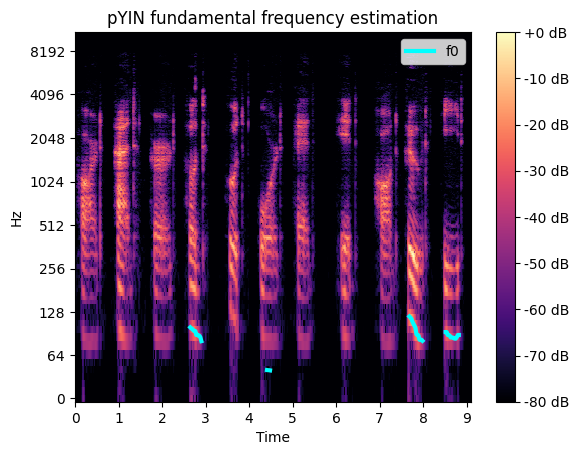

In [900]:
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
import scipy

#create a single sample array containing all the words
concat_words_y = np.array([])
for idx, fname in enumerate(phonemefilenames):
    formants
    y, sr = librosa.load(basedir + fname)
    concat_words_y = np.append(concat_words_y, y)
y = concat_words_y

#run pyin to estimate pitch/f0

f0, voiced_flag, voiced_probs = librosa.pyin(y, sr=sr,
                                          fmin=40,
                                          fmax=700)
# Pitch range for humans is 70-900 Hz (Heylen et al., 2002)

times = librosa.times_like(f0)

# plot the spectro and overlay the pitch estimate

D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
fig, ax = plt.subplots()
img = librosa.display.specshow(D, x_axis='time', y_axis='log', ax=ax)
ax.set(title='pYIN fundamental frequency estimation')
fig.colorbar(img, ax=ax, format="%+2.f dB")
ax.plot(times, f0, label='f0', color='cyan', linewidth=3)
ax.legend(loc='upper right')


#compute the average pitch from the non-nan pitch estimates
f0nonan = f0[~np.isnan(f0)]  # Use ~np.isnan() to remove NaN values
f0mean = np.mean(f0nonan)


**2.e Your own voice**

1. Record yourself saying the 10 words (the same words used in the files you just processed) leaving a pause between each word.
2. Using Audacity break it up into 10 wav files and save them as 16 bit mono wav recordings. (https://www.audacityteam.org/)
3. Choose a random 6 digit code as the speaker ID and save the files as `<speakerid>-<phonemename>.wav`
4. Repeat the exercise above and Plot **all the results** (spectrum, F0, F1 and F2 plots, etc.), as shown in the previous items.
5. Examine and comment the how the different voices impact the results.
    * Do the points for the multiple utterances of the same word with your voice cluster together?
    * Do the points for the utterances of the same word with different people cluster together?
    * Are other people's samples clustered with yours?

Not required but, if you are willing to share you wav files, create a zip containing them and upload them too.

In [918]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import fftpack
from os import listdir
import IPython.display as ipd

%matplotlib inline

import os
print("DIR original:", os.getcwd())
os.chdir('/Users/jayce/Desktop/DigMed/HM3')  #changed to my working directory
print("DIR working:", os.getcwd())
!ls


DIR original: /Users/jayce/Desktop/DigMed/HM3
DIR working: /Users/jayce/Desktop/DigMed/HM3
HW3.ipynb           dtmf_tones.wav      myvoice             speakerformants.csv
dtmf_generated.wav  dtmfnumbers.wav     phonemes
dtmf_signal.wav     myAudio             plots


In [919]:

basedir='./myvoice/'
phonemefilenames= os.listdir(basedir)
phonemenames=[]
formants=[[],[]]
phonemefilenames = [x for x in phonemefilenames if x.__contains__('.wav')] # remove non-wavfiles from list

# parse out the word names from the files by getting the text between the - and the .wav extn
phonemenames = [name.split('-')[-1].split('.')[0] for name in phonemefilenames]
speakerid = [name.split('-')[0].split('.')[0] for name in phonemefilenames]
dfformants=pd.DataFrame(columns=['speaker','word','f1','f2'])
dfformants['speaker']=speakerid
dfformants['word']=phonemenames

# Extract formant values from audio files
for idx, filename in enumerate(phonemefilenames):
    full_path = os.path.join(basedir, filename)
    snd = parselmouth.Sound(full_path)
    formant = snd.to_formant_burg(max_number_of_formants=2)
    
    # Get the duration of the sound
    duration = snd.get_total_duration()
    
    # Initialize lists to store F1 and F2 values
    f1_values = []
    f2_values = []
    
    # Iterate over time points
    time_step = 0.01  # Choose a time step (in seconds)
    for time_point in np.arange(0, duration, time_step):
        f1 = formant.get_value_at_time(1, time_point)
        f2 = formant.get_value_at_time(2, time_point)
        if not pd.isnull(f1):
            f1_values.append(f1)
        if not pd.isnull(f2):
            f2_values.append(f2)
    
    # Calculate mean F1 and F2 values
    f1_value = sum(f1_values) / len(f1_values) if f1_values else None
    f2_value = sum(f2_values) / len(f2_values) if f2_values else None

    # Assign F1 and F2 values to the DataFrame
    dfformants.at[idx, 'f1'] = f1_value
    dfformants.at[idx, 'f2'] = f2_value

# Display the DataFrame
print(dfformants)





   speaker   word           f1           f2
0   215021   hood  1037.671029   3473.82278
1   215021   head  2351.785463  3280.461784
2   215021   hudd  1519.713783  3940.428015
3   215021    hid    2063.9101  3278.979638
4   215021   hard  1352.019115   3746.89278
5   215021    hod  1182.284723  3478.046674
6   215021   heed  2552.115086  3226.189274
7   215021    had  1245.436817  4501.905445
8   215021  heard  1145.970425  3366.662009
9   215021   whod  1249.407932  3264.168466
10  215021  hoard  1008.186827  3213.608416


In [920]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

# Load the audio file
fileidx = 1  # Index of the second file
x, sr = librosa.load(basedir + phonemefilenames[fileidx], offset=0.1, duration=0.7)

# Path to the directory containing the audio files
basedir = './myvoice/'

# Get a list of all audio files in the directory
audio_files = [file for file in os.listdir(basedir) if file.endswith('.wav')]

# Iterate over each audio file and play it
for audio_file in audio_files:
    # Load the audio file
    audio_path = os.path.join(basedir, audio_file)
    
    # Display the audio player
    print("Playing:", audio_file)
    ipd.display(ipd.Audio(audio_path))



Playing: 215021-hood.wav


Playing: 215021-head.wav


Playing: 215021-hudd.wav


Playing: 215021-hid.wav


Playing: 215021-hard.wav


Playing: 215021-hod.wav


Playing: 215021-heed.wav


Playing: 215021-had.wav


Playing: 215021-heard.wav


Playing: 215021-whod.wav


Playing: 215021-hoard.wav


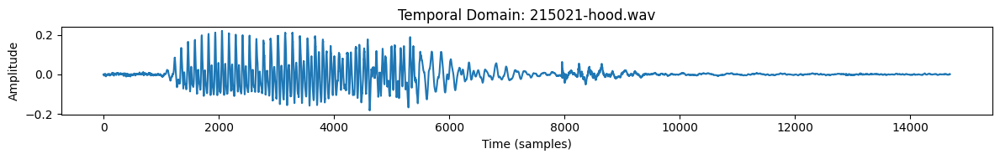

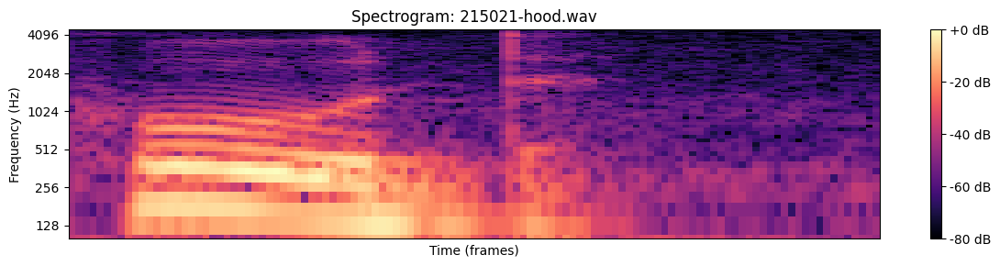

Playing: 215021-hood.wav


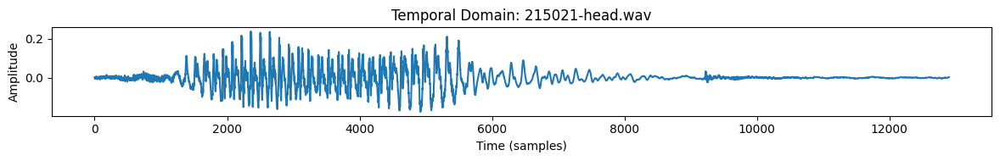

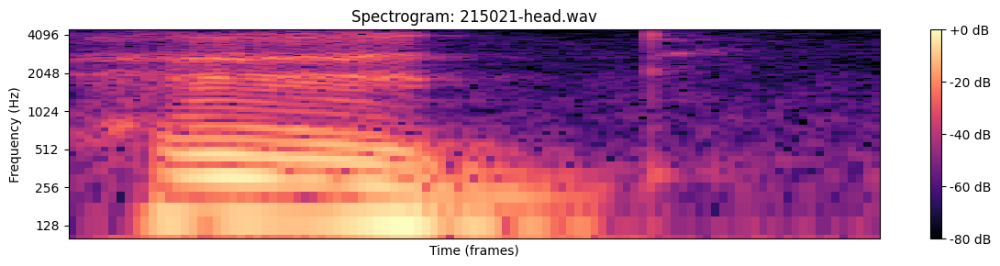

Playing: 215021-head.wav


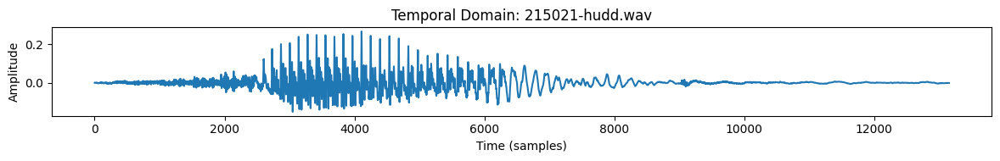

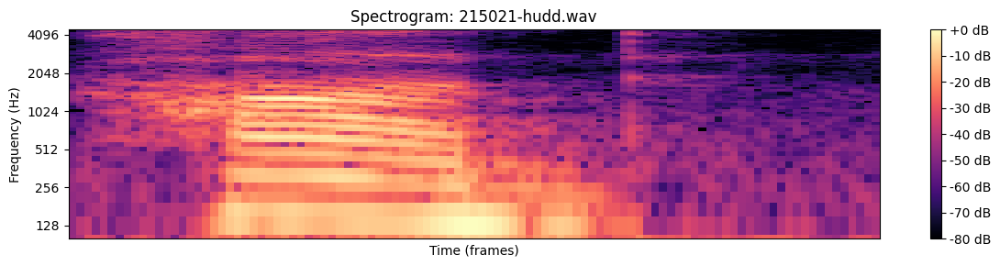

Playing: 215021-hudd.wav


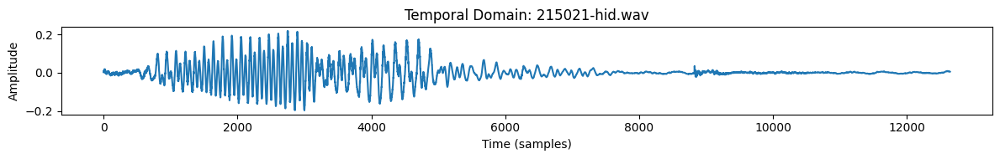

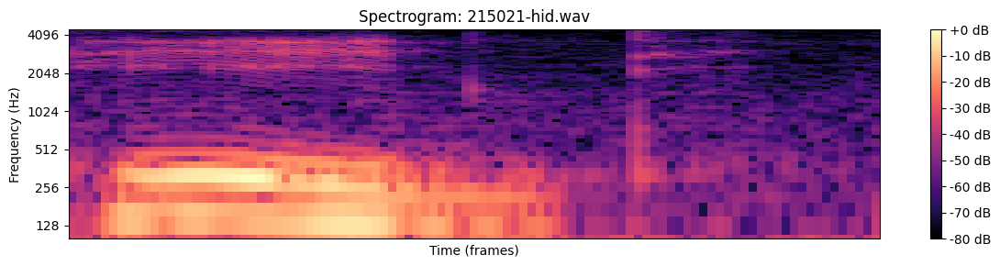

Playing: 215021-hid.wav


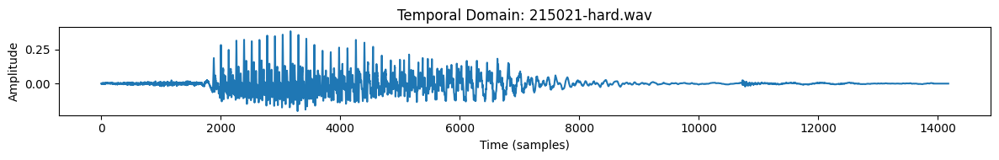

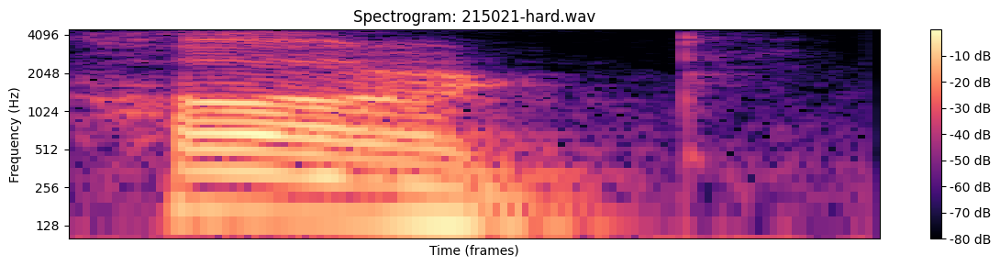

Playing: 215021-hard.wav


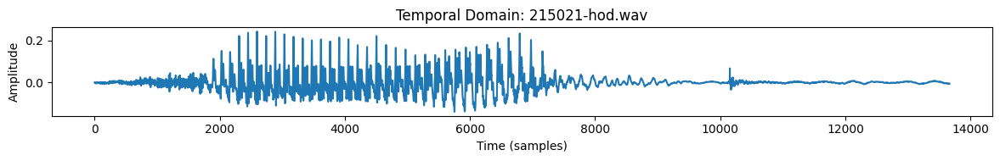

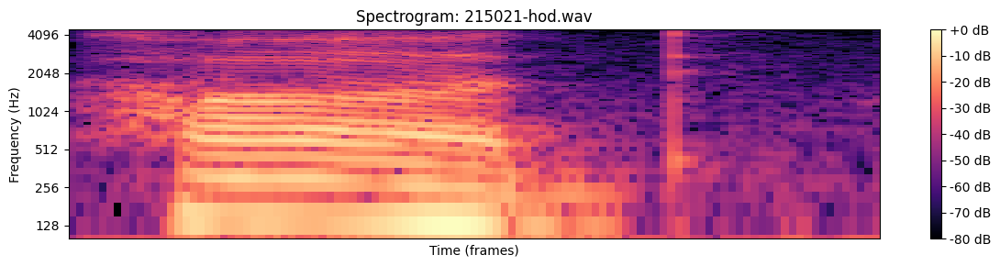

Playing: 215021-hod.wav


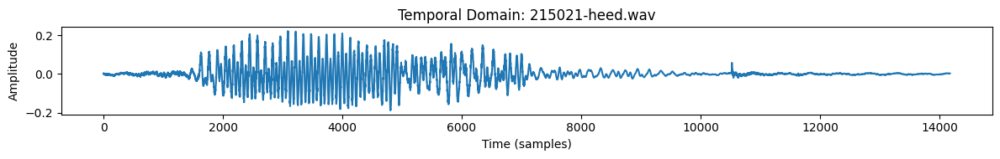

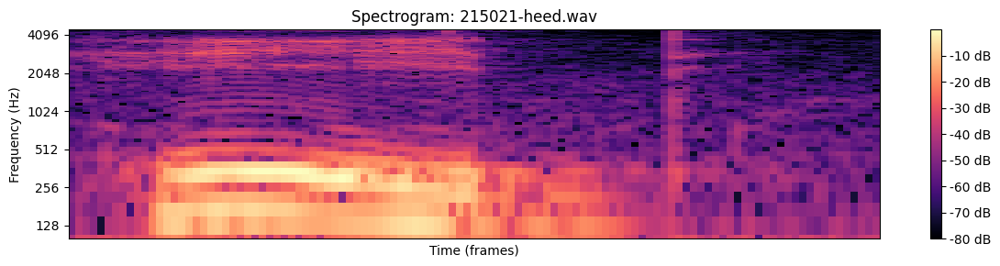

Playing: 215021-heed.wav


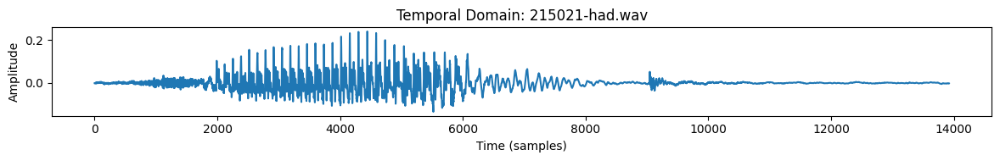

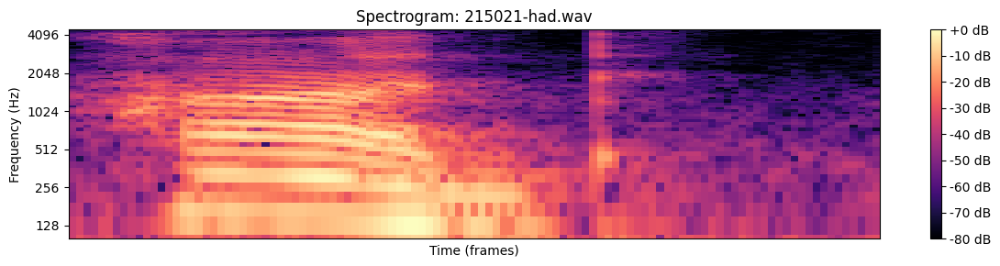

Playing: 215021-had.wav


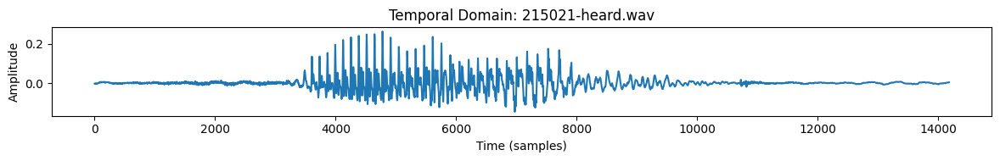

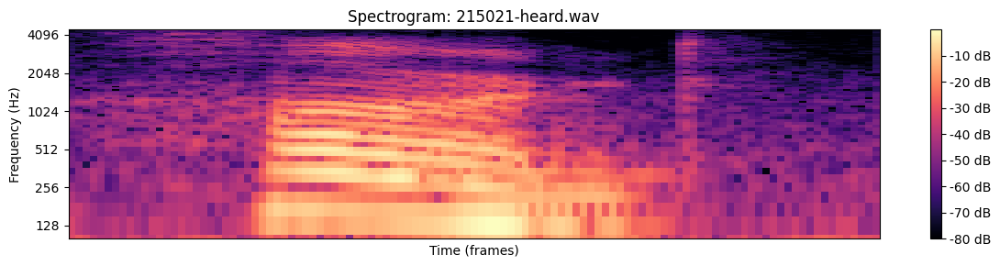

Playing: 215021-heard.wav


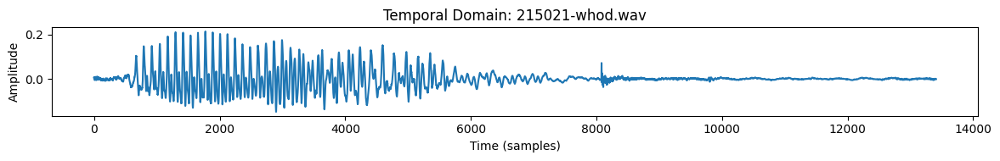

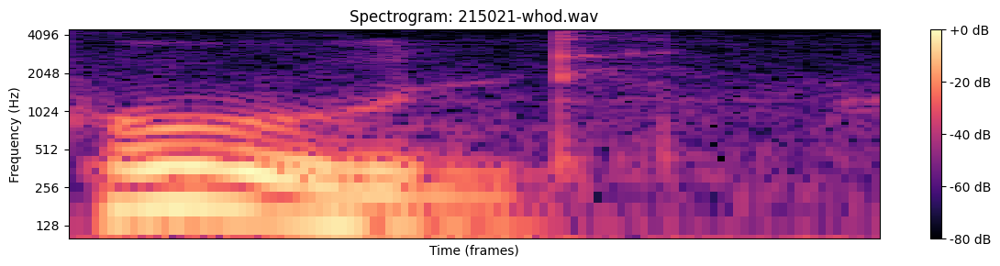

Playing: 215021-whod.wav


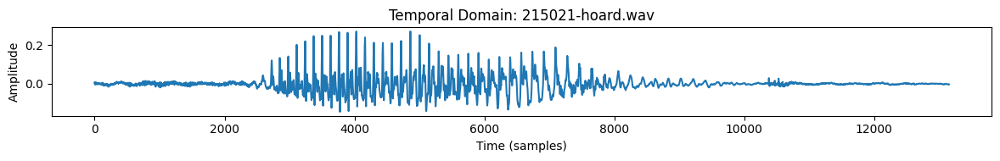

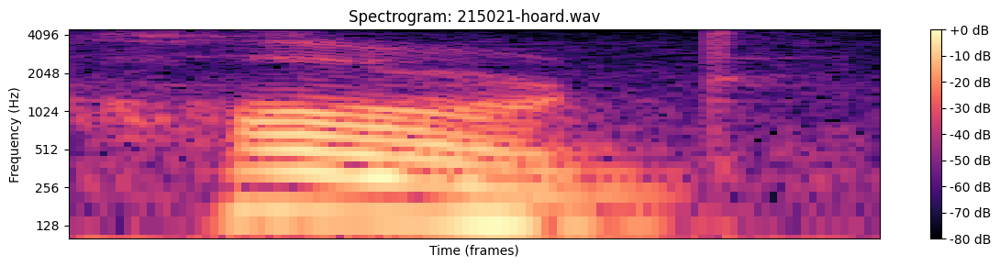

Playing: 215021-hoard.wav


In [921]:
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

# Path to the directory containing the audio files
basedir = './myvoice/'

# Get a list of all audio files in the directory
audio_files = [file for file in os.listdir(basedir) if file.endswith('.wav')]

# Iterate over each audio file
for fileidx, audio_file in enumerate(audio_files):
    # Load the audio file
    # modify the offset and duration to see the change!
    #x, sr = librosa.load(os.path.join(basedir, audio_file), offset=0.5, duration=1.0)

    x, sr = librosa.load(os.path.join(basedir, audio_file), offset=0.1, duration=0.7)
    
    # Plot the signal in the temporal domain
    plt.figure(figsize=(12, 2))
    plt.plot(x)
    plt.title("Temporal Domain: " + audio_file)
    plt.xlabel('Time (samples)')
    plt.ylabel('Amplitude')
    plt.tight_layout()
    plt.show()
    
    # Compute and plot the spectrogram in the frequency domain
    plt.figure(figsize=(12, 3))
    # Change n_fft to 1024 to see the differences.
    #D = librosa.amplitude_to_db(np.abs(librosa.stft(x, n_fft=1024)), ref=np.max)

    D = librosa.amplitude_to_db(np.abs(librosa.stft(x, n_fft=512)), ref=np.max)
    librosa.display.specshow(D, y_axis='log')
    plt.title("Spectrogram: " + audio_file)
    plt.colorbar(format='%+2.0f dB')
    plt.ylim(100, 4500)
    plt.xlabel('Time (frames)')
    plt.ylabel('Frequency (Hz)')
    plt.tight_layout()
    plt.show()

    # Display the audio
    print("Playing:", audio_file)
    ipd.display(ipd.Audio(os.path.join(basedir, audio_file)))


plots directory already exists
Phoneme filenames: ['215021-hood.wav', '215021-head.wav', '215021-hudd.wav', '215021-hid.wav', '215021-hard.wav', '215021-hod.wav', '215021-heed.wav', '215021-had.wav', '215021-heard.wav', '215021-whod.wav', '215021-hoard.wav']
phonemenames: ['hood', 'head', 'hudd', 'hid', 'hard', 'hod', 'heed', 'had', 'heard', 'whod', 'hoard']


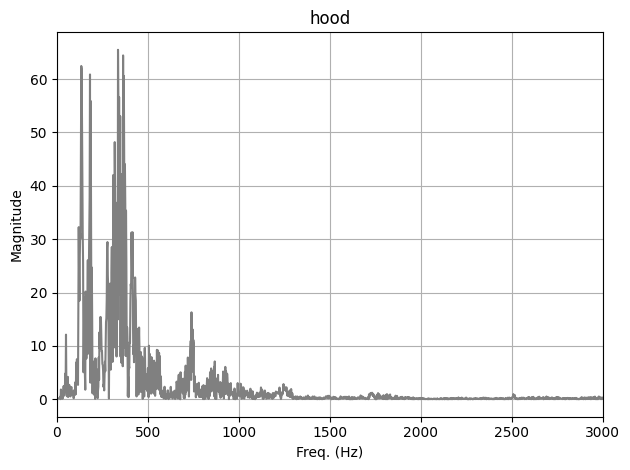

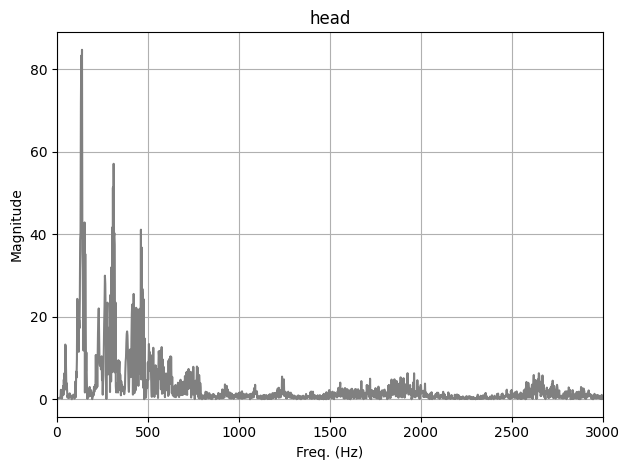

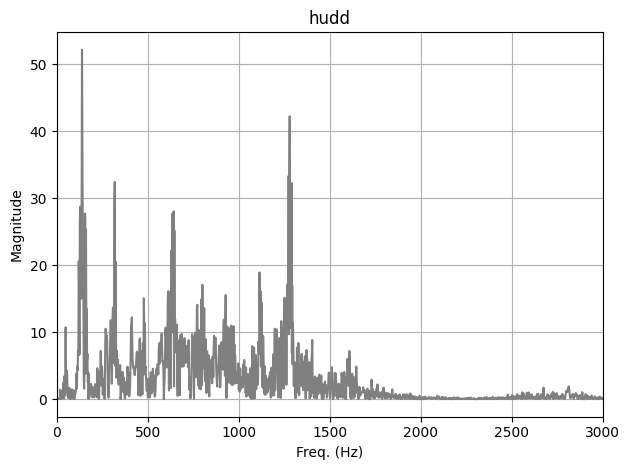

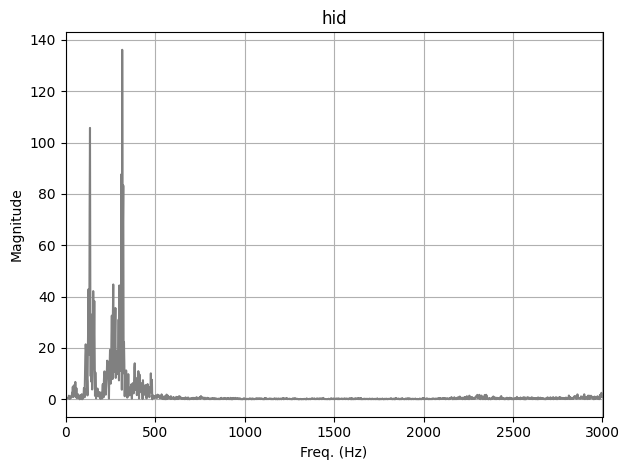

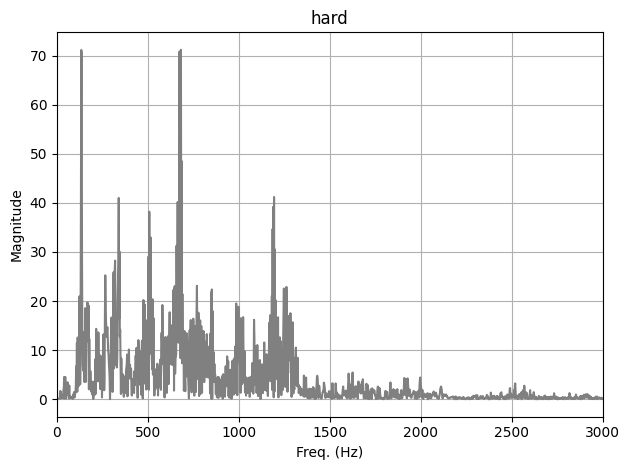

...

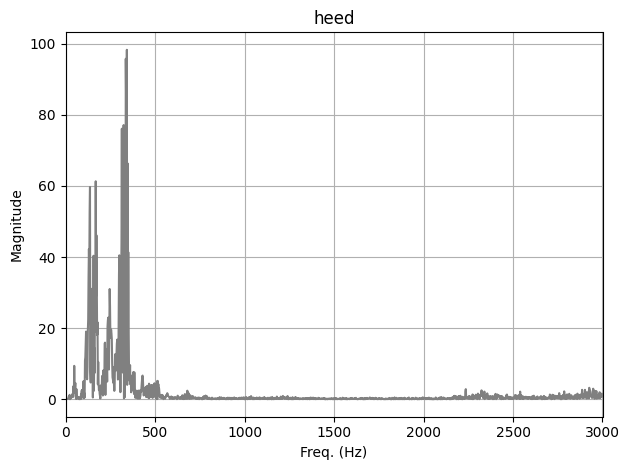

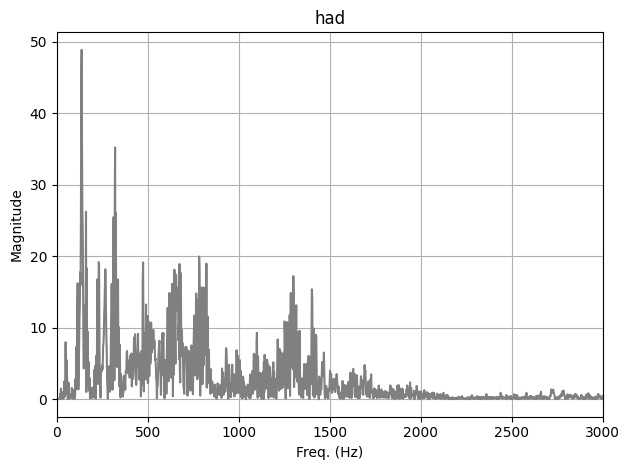

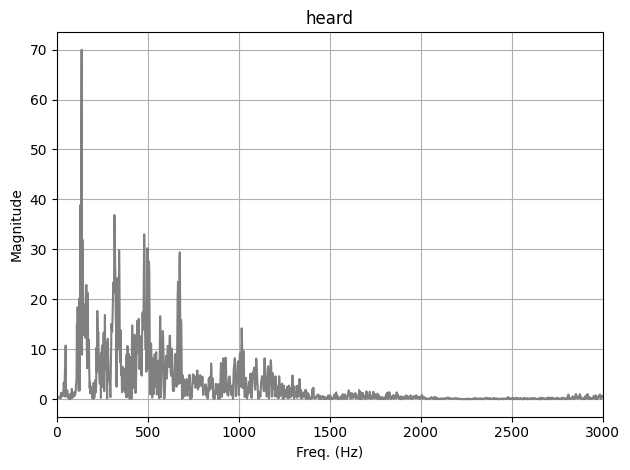

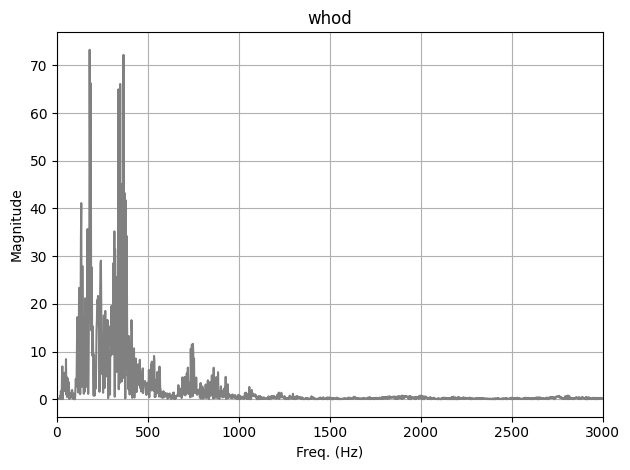

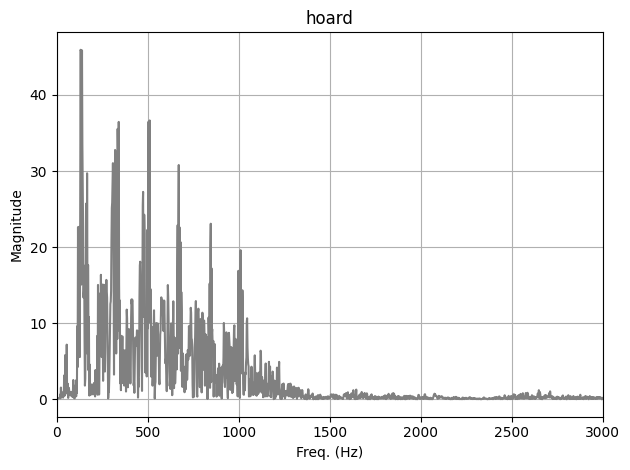

In [922]:
import os
import pandas as pd
import librosa
import numpy as np
from scipy import fftpack
import matplotlib.pyplot as plt
import librosa.display

# Create plots directory if it doesn't exist
try:
    os.mkdir('plots')
except OSError:
    print('plots directory already exists')

# Parse out the word names from the files by getting the text between the - and the .wav extension
phonemenames = [name.split('-')[-1].split('.')[0] for name in phonemefilenames]

# Print the phoneme filenames for inspection
print("Phoneme filenames:", phonemefilenames)
print("phonemenames:", phonemenames)
# Initialize formants list
formants = [[], []]

for idx, fname in enumerate(phonemefilenames):
    x_1, fs = librosa.load(basedir + fname, duration=0.5, offset=0.1)

    # Compute FFT
    X = fftpack.fft(x_1)
    freq = fftpack.fftfreq(len(x_1)) * fs
    freqidx = int(len(freq) / 2)
    freq = freq[1:freqidx]
    mag = np.abs(X.real)
    mag = mag[1:freqidx]

    # Plot spectrum
    plotSpectrum(freq, mag, phonemenames[idx])

    # Find peaks using librosa peak_pick
    indexes = librosa.util.peak_pick(mag, pre_max=3, post_max=3, pre_avg=3, post_avg=5, delta=0.1, wait=1)
    peaks = [freq[indexes], mag[indexes]]

    # Create DataFrame
    peaksdf = pd.DataFrame(peaks).T
    peaksdf.columns = ['freq', 'mag']

    # Find F1 and F2 formants
    fmin = 250
    f1max = 650
    f2max = 3000

    f1peaks = peaksdf[peaksdf.freq.between(fmin, f1max)]
    f1 = f1peaks['freq'][f1peaks['mag'].idxmax()]

    f2peaks = peaksdf[peaksdf.freq.between(f1max, f2max)]
    f2 = f2peaks['freq'][f2peaks['mag'].idxmax()]

    # Append formants to the list
    formants[0].append(f1)
    formants[1].append(f2)


# Create DataFrame with formants
dfformants = pd.DataFrame(columns=['speaker', 'word', 'f1', 'f2'])
dfformants['speaker'] = speakerid
dfformants['word'] = phonemenames
dfformants['f1'] = formants[0]
dfformants['f2'] = formants[1]

# Save DataFrame to CSV
dfformants.to_csv('speakerformants.csv')




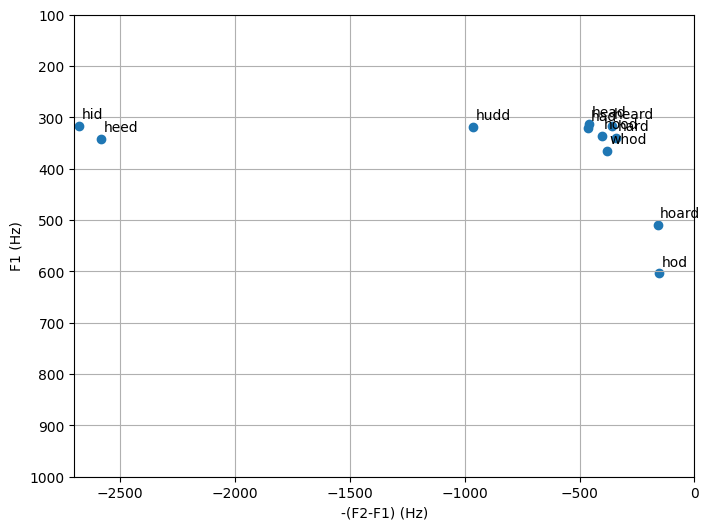

In [923]:
fig1=plt.figure(figsize=(8, 6))
ax2=fig1.add_subplot(111)
plt.scatter(-(dfformants['f2']-dfformants['f1']),dfformants['f1'])

for idx, phonemename in enumerate(phonemenames):
    ax2.annotate(phonemename,  xy=(-(formants[1][idx]-formants[0][idx])+10,formants[0][idx]-15))

#plt.grid('both')
plt.xlim((-2700, 0))
plt.ylim((1000, 100))
plt.grid(axis='both')
plt.xlabel('-(F2-F1) (Hz)')
plt.ylabel('F1 (Hz)')

plt.savefig('plots/vowelf1f2male453353.png')
plt.show()

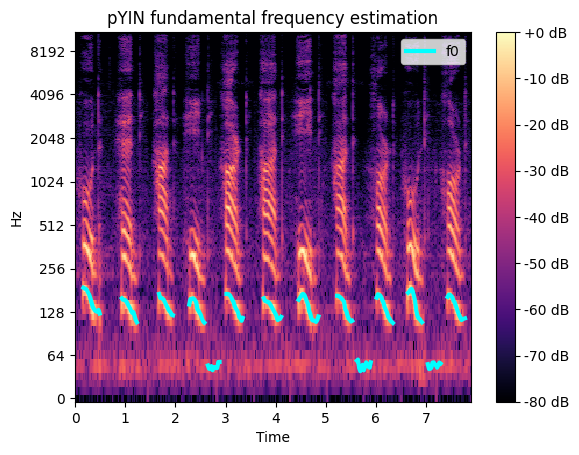

In [924]:
import matplotlib.pyplot as plt
import numpy as np
import librosa.display
import scipy

#create a single sample array containing all the words
concat_words_y = np.array([])
for idx, fname in enumerate(phonemefilenames):
    formants
    y, sr = librosa.load(basedir + fname)
    concat_words_y = np.append(concat_words_y, y)
y = concat_words_y

#run pyin to estimate pitch/f0

f0, voiced_flag, voiced_probs = librosa.pyin(y, sr=sr,
                                          fmin=40,
                                          fmax=700)
# Pitch range for humans is 70-900 Hz (Heylen et al., 2002)

times = librosa.times_like(f0)

# plot the spectro and overlay the pitch estimate

D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
fig, ax = plt.subplots()
img = librosa.display.specshow(D, x_axis='time', y_axis='log', ax=ax)
ax.set(title='pYIN fundamental frequency estimation')
fig.colorbar(img, ax=ax, format="%+2.f dB")
ax.plot(times, f0, label='f0', color='cyan', linewidth=3)
ax.legend(loc='upper right')


#compute the average pitch from the non-nan pitch estimates
f0nonan = f0[~np.isnan(f0)]  # Use ~np.isnan() to remove NaN values
f0mean = np.mean(f0nonan)
